In [1]:
## package imports ##
import sys
import pdkit
sys.path.append("../../src")
import utils.query_utils as query
import synapseclient as sc
import matplotlib.pyplot as plt
from scipy import signal
import warnings
from scipy.fftpack import (rfft, fftfreq)
from scipy.signal import (butter, lfilter, correlate, freqz)
import pandas as pd
import seaborn as sns
import numpy as np
from sklearn import metrics
%matplotlib inline
%load_ext autoreload
%autoreload 2
warnings.simplefilter("ignore")
sns.set_style("dark")
plt.rcParams['figure.figsize'] = [10, 5]
syn = sc.login()

Welcome, aryton tediarjo!



INFO:synapseclient_default:Welcome, aryton tediarjo!



In [2]:
def butter_lowpass_filter(data, sample_rate, cutoff=10, order=4, plot=False):
    """
        `Low-pass filter <http://stackoverflow.com/questions/25191620/
        creating-lowpass-filter-in-scipy-understanding-methods-and-units>`_ data by the [order]th order zero lag Butterworth filter
        whose cut frequency is set to [cutoff] Hz.
        :param data: time-series data,
        :type data: numpy array of floats
        :param: sample_rate: data sample rate
        :type sample_rate: integer
        :param cutoff: filter cutoff
        :type cutoff: float
        :param order: order
        :type order: integer
        :return y: low-pass-filtered data
        :rtype y: numpy array of floats
        :Examples:
        >>> from mhealthx.signals import butter_lowpass_filter
        >>> data = np.random.random(100)
        >>> sample_rate = 10
        >>> cutoff = 5
        >>> order = 4
        >>> y = butter_lowpass_filter(data, sample_rate, cutoff, order)
    """


    nyquist = 0.5 * sample_rate
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)

    if plot:
        w, h = freqz(b, a, worN=8000)
        plt.subplot(2, 1, 1)
        plt.plot(0.5*sample_rate*w/np.pi, np.abs(h), 'b')
        plt.plot(cutoff, 0.5*np.sqrt(2), 'ko')
        plt.axvline(cutoff, color='k')
        plt.xlim(0, 0.5*sample_rate)
        plt.title("Lowpass Filter Frequency Response")
        plt.xlabel('Frequency [Hz]')
        plt.grid()
        plt.show()

    y = lfilter(b, a, data)

    return y


def detect_zcr(array):
    """
    function to detect zero crossing rate
    parameter:
        `array`: numpy array
    returns indexes before sign changes
    """
    zero_crossings = np.where(np.diff(np.sign(array)))[0]
    return zero_crossings

def clean_phyphox_data(data):    
    """
    function to clean phyphox data
    parameter:
        `data`: pandas dataframe
    returns cleaned pandas dataframe
    """
    data = data.rename({"Gyroscope x (rad/s)":  "x", 
                        "Gyroscope y (rad/s)": "y",
                        "Gyroscope z (rad/s)": "z",
                        "Absolute (rad/s)"   : "AA",
                        "Time (s)": "timestamp"}, axis = 1)

    data = query.clean_accelerometer_data(data)
    gp = pdkit.GaitProcessor(duration=data.td[-1])
    data = gp.resample_signal(data)
    return data



def get_accel_longitudinal(accel_data, start, end, plots = False):
    """
    function to add low pass filtered acceleration longitudinal data 
    plot heel strikes occurences in the longitudinal data
    parameter:
    `accel_data`: time series of acceleration (pandas dataframe)
    `start`     : start of the timestamp (int)
    `end`       : end of timestamp (int)
    `plots`     : logical function to plot (boolean)
    returns dataframe, and longitudinal plot if designated by user
    """
    if accel_data.shape[0] == 0:
        return
    
    ts = accel_data.loc["1970-01-01 00:00:%d.000" %start: "1970-01-01 00:00:%d.000" %end]
    print(ts.td[-1] - ts.td[0])
    gp = pdkit.GaitProcessor(duration = ts.td[-1] - ts.td[0],
                            cutoff_frequency = 2,
                            filter_order = 2,
                            delta = 0.5)
    ts = gp.resample_signal(ts)
    for i in ["x", "y", "z"]:
        ts["filtered_%s" %i] = butter_lowpass_filter(ts[i], sample_rate = 100, cutoff = 2, order = 2)
    print("mean: %s" %ts["filtered_y"].median())
    print("std: %s" %ts["filtered_y"].var())
    if plots:
        for orient in ["x", "filtered_x", "y", "filtered_y", "z", "filtered_z"]:
            plt.figure(figsize = (10,5))
            ts[orient].plot()
            plt.axhline(y=0.0, color='r', linestyle='-.')
            try:
                if "filtered" in orient:
                    heel_strikes_idx = gp.heel_strikes(ts[orient.split("_")[1]])[1]
                else:
                    heel_strikes_idx = gp.heel_strikes(ts[orient])[1]
            except:
                heel_strikes_idx = []
            for index in heel_strikes_idx:
                plt.axvline(x=ts.iloc[index].name, color='black', linestyle='-.')
            plt.grid()
            plt.title("Signal in the %s axis" %orient)
            plt.show()
    return ts
        
        
def get_gyro_longitudinal(gyro_data, start, end, plots = False):
    """
    function to add low-pass filtered gyroscope longitudinal data 
    parameter:
    `gyro_data`: time series of acceleration (pandas dataframe)
    `start`     : start of the timestamp (int)
    `end`       : end of timestamp (int)
    `plots`     : logical function to plot (boolean)
    returns dataframe, and longitudinal plot if designated by user
    """
    if gyro_data.shape[0] == 0:
        return
    ts = gyro_data.loc["1970-01-01 00:00:%d.000" %start: "1970-01-01 00:00:%d.000" %end]
    gp = pdkit.GaitProcessor(duration = ts.td[-1] - ts.td[0],
                            cutoff_frequency = 2,
                            filter_order = 2)
    ts = gp.resample_signal(ts)
    sample_rate = ts.shape[0]/ts.td[-1]
    for i in ["x", "y", "z"]:
        ts["filtered_%s" %i] = butter_lowpass_filter(ts[i], sample_rate = 100, cutoff = 2, order = 2)
    if plots:
        for cols in ["x", "filtered_x", "y", "filtered_y", "z", "filtered_z"]:
            plt.figure(figsize = (10,5))
            ts[cols].plot()
            plt.axhline(y=0.0, color='r', linestyle='-.')
            plt.grid()
            plt.ylim(-5,5)
            plt.title("Signal in the %s axis" %cols)
            plt.show()
    return ts

def calculate_rotation(data, orient):
    """
    function to calculate rotational movement gyroscope AUC * period of zero crossing
    parameter:
    `data`  : pandas dataframe
    `orient`: orientation (string)
    returns dataframe of calculation of auc and aucXt
    """
    start = 0
    dict_list = {}
    dict_list["td"] = []
    dict_list["auc"] = []
    dict_list["period"] = []
    dict_list["aucXt"] = []
    zcr_list = detect_zcr(data[orient].values)
    for i in zcr_list: 
        x = data["td"].iloc[start:i+1].values
        y = data[orient].iloc[start:i+1].values
        period = data["td"].iloc[i+1] - data["td"].iloc[start]
        start  = i + 1
        if (len(y) >= 2):
            auc = np.abs(metrics.auc(x,y)) 
            aucXt = auc * period
            dict_list["td"].append(x[-1])
            dict_list["period"].append(period)
            dict_list["auc"].append(auc)
            dict_list["aucXt"].append(aucXt)
    data = pd.DataFrame(dict_list)
    return data

# Turn Detection during Gait Study
- In the gait study, subjects are required to walk for 30 seconds, however, there are cases where subjects does not have the sufficient space to walk entirely during the whole test and is required to make turns, which will cause biases to our calculation, therefore turning will be ommitted during the test.

## 1. Detecting Rotation From Gyroscope Data

Per the reseach paper from "Smartphone App–Based Assessment of Gait During Normal and Dual-Task Walking: Demonstration of Validity and Reliability", the way to calculate turns on dual-task of gait assessment is to preprocess the the gyroscope data by integrating the gyroscope data in respect of time, during a period before any zero crossing.

Here are the preprocessing steps of longitudinal data that I will assess on:

- Implement low-pass filter with filter order of 2 and cutoff frequency of 2 Hz (arbitrary); TODO later
- Search for zero crossing occurences in terms of timesteamp
- For each period before zero crossing, integrate radians in terms of timestamp
- If product of auc and time is above 2 radian-seconds, it is a good indicator that subject is turning
- TODO note: research paper indicates proposed in computing the z-axis gyroscope data for the turn-detection, however, y-axis gyroscope data can be more sensitive towards detecting turns, this will be investigated further
- Period where turning occurs will be removed from the acceleration data

In [3]:
path_data = query.get_walking_synapse_table(syn, 
                                            "syn12514611", 
                                            "V2", 
                                            healthCodes = ["1fa674e9-2c49-4260-83f0-681ace2a5125", # parkinson
                                                          "c52432c0-754b-4490-b131-9684da102f6c", # control 
                                                          "e8167893-1b3a-4c71-94f4-5b3cb9b52165", # control
                                                          "f80e44ed-ce6f-4aff-8a6a-cfa74c823f6a"]) # parkinson

Querying V2 Data


INFO:synapseclient_default:Downloading 8 files, 216 cached locally


## 2.) Test on Balance Data
First we test this idea on the balance data, where we know that the first 5 seconds is a prompt from mpower to ask users to turn 180 degrees, this will be a sample to see whether we can detect turning from gyroscope.

Sampling rate is 99.125 Hz


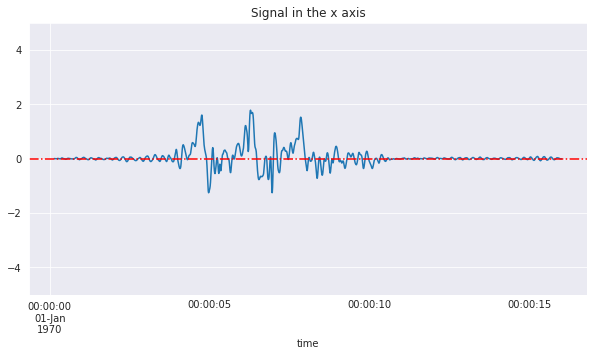

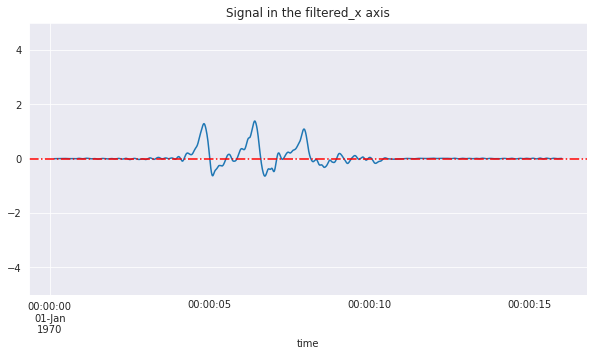

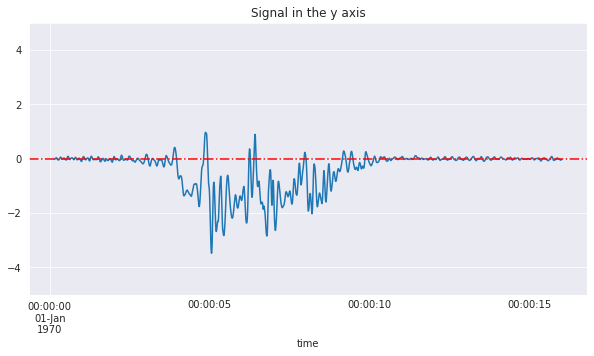

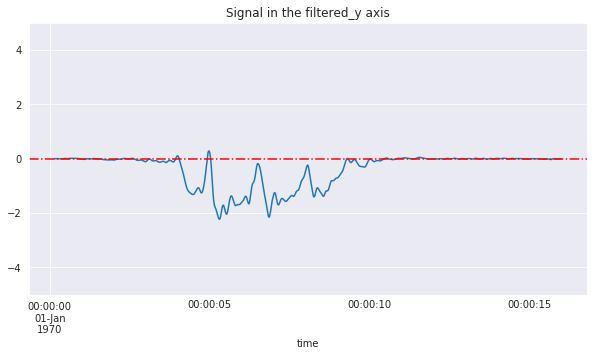

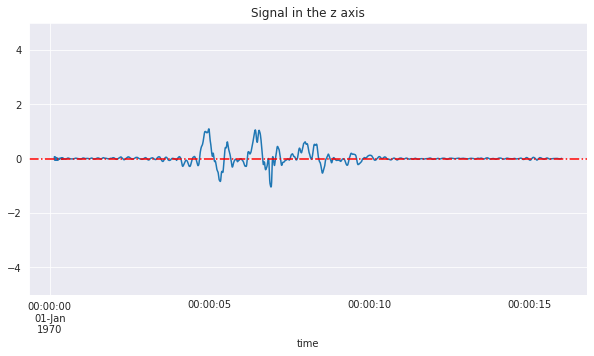

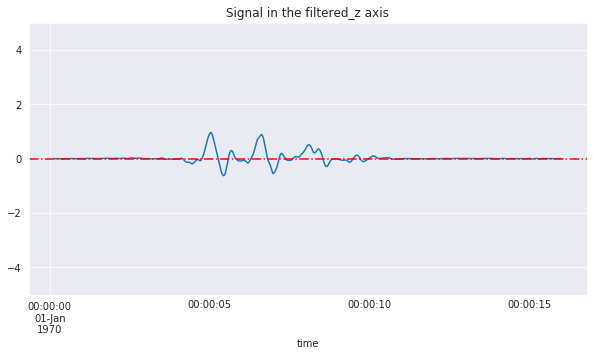

In [4]:
balance_ts = query.open_filepath(path_data["balance_motion.json_pathfile"].iloc[1])
balance_ts = query.clean_accelerometer_data(balance_ts)
balance_gyro = balance_ts[balance_ts["sensorType"] == "rotationRate"]
balance_gyro = get_gyro_longitudinal(balance_gyro, 0, 15, plots = True)

In [5]:
balance_rot_x = calculate_rotation(balance_gyro, "filtered_x")
balance_rot_y = calculate_rotation(balance_gyro, "filtered_y")
balance_rot_z = calculate_rotation(balance_gyro, "filtered_z")

In [6]:
## x - rotational motion
balance_rot_x.sort_values("aucXt", ascending = False).head(5)

,td,auc,period,aucXt
32,6.583243,0.490397,0.734405,0.360150
28,4.993707,0.436289,0.794768,0.346749
36,8.152661,0.385516,0.855131,0.329667
33,7.086261,0.203849,0.503019,0.102540
37,8.957492,0.119654,0.804831,0.096301


In [7]:
## y - rotational motion
balance_rot_y.sort_values("aucXt", ascending = False).head(5)

,td,auc,period,aucXt
16,9.289484,5.244102,4.265597,22.369227
14,4.913224,0.814749,0.875251,0.713110
18,10.456489,0.140168,1.136824,0.159347
12,3.927309,0.101451,1.297784,0.131661
8,2.287472,0.023486,0.855128,0.020083


In [8]:
## z - rotational motion
balance_rot_z.sort_values("aucXt", ascending = False).head(5)

,td,auc,period,aucXt
26,8.534956,0.232378,0.935615,0.217416
22,6.804571,0.267093,0.523139,0.139727
18,5.255276,0.273608,0.503018,0.137630
27,9.470571,0.078092,0.935616,0.073064
8,2.941394,0.022607,1.901402,0.042986


This dataframe shows that during the zero crossing at fifth second, there is an apparent rotational motion from the user, which is signified by having auc of angular velocity between zero crossing period * timestamps in seconds > 2.00 radian-seconds. In this case it has recognized an z-axis auc-seconds of 3.8 radians-secs in the fifth seconds. Note that the gyroscope in the y axis are better able in recognizing turns, however it is fluctuating more wildly in comparison to the gyroscope data in the z-axis coordinate. 

## 3.) Test on Walking Data

In [9]:
_ts = query.open_filepath(path_data["walk_motion.json_pathfile"].iloc[3])
_ts = query.clean_accelerometer_data(_ts)
gyroscope = _ts[_ts["sensorType"] == "rotationRate"]
acceleration = _ts[_ts["sensorType"] == "accelerometer"]
user_acceleration = _ts[_ts["sensorType"] == "userAcceleration"]

23.990183583
Sampling rate is 100.0 Hz
mean: -0.0182260940439112
std: 0.005060480792793994


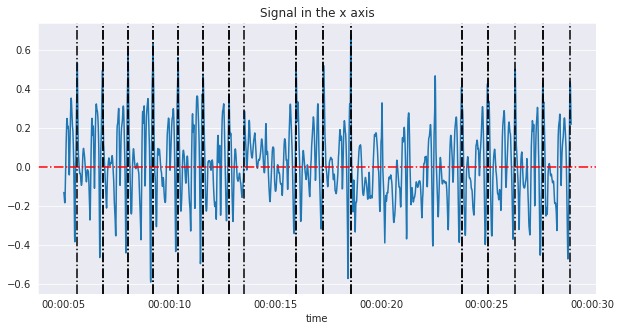

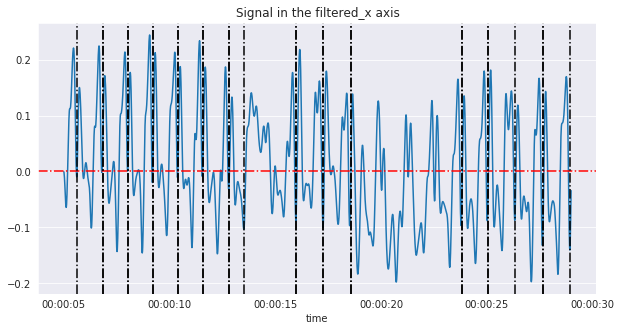

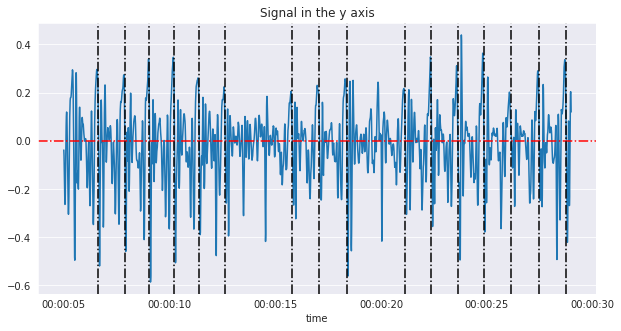

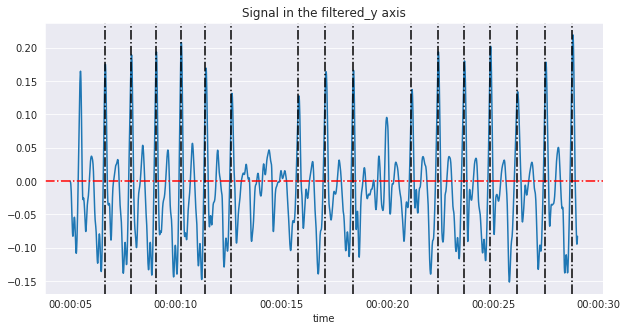

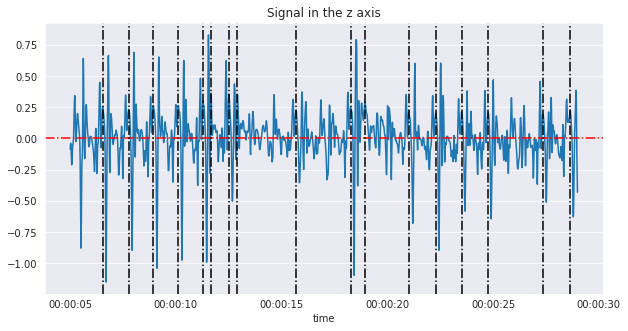

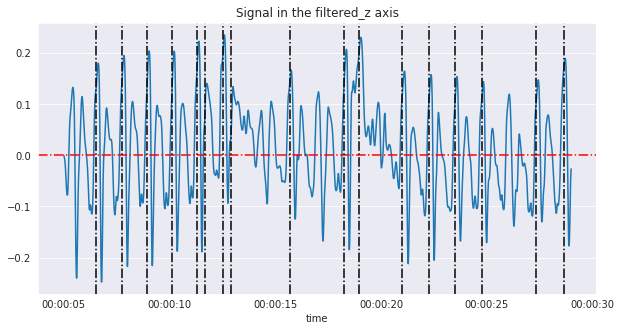

In [10]:
_accel = get_accel_longitudinal(user_acceleration, 5, 28, plots = True)

Sampling rate is 100.0 Hz


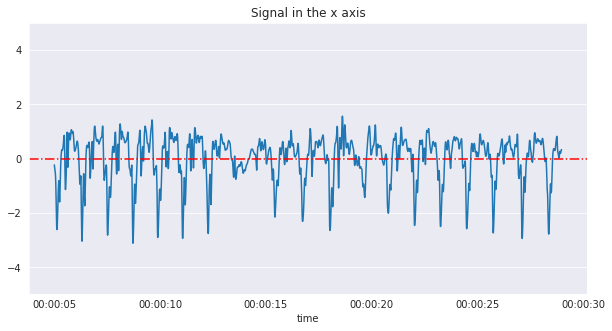

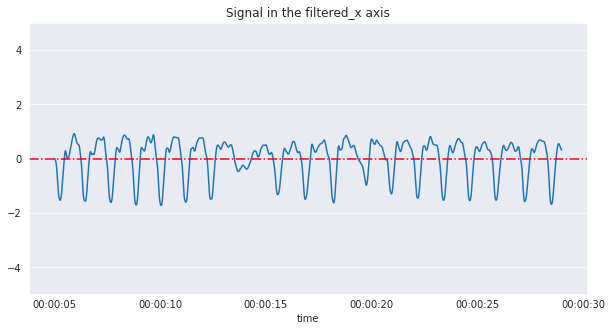

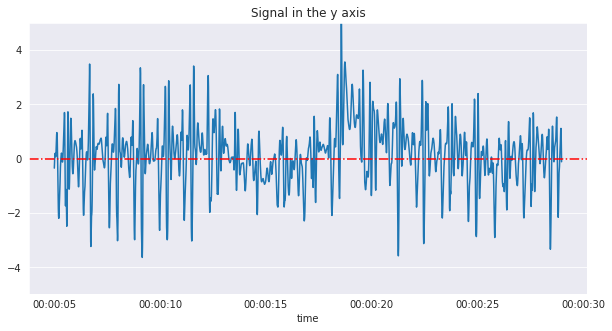

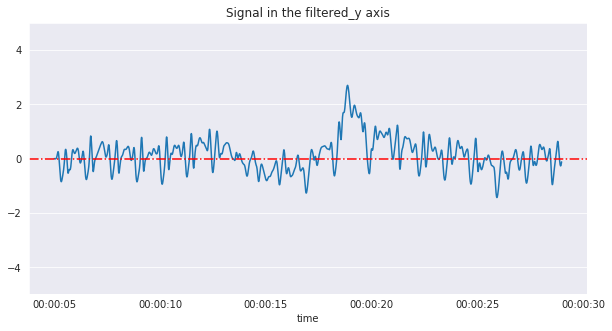

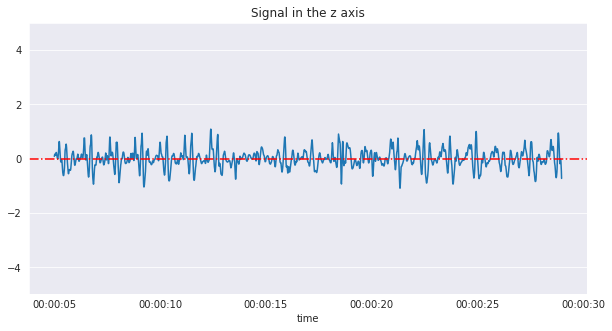

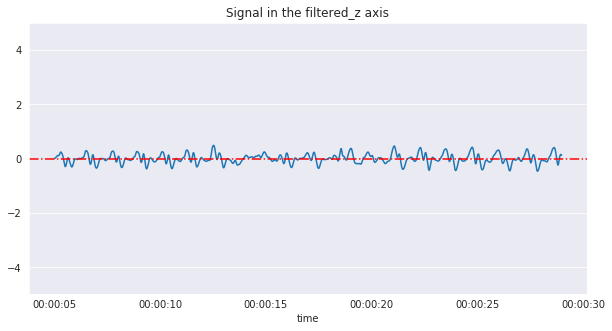

In [13]:
_gyro = get_gyro_longitudinal(gyroscope, 5, 28, plots = True)
balance_rot_y = calculate_rotation(_gyro, "filtered_y")
balance_rot_x = calculate_rotation(_gyro, "filtered_x")
balance_rot_z = calculate_rotation(_gyro, "filtered_z")

In [14]:
balance_rot_x.sort_values("aucXt", ascending = False).head(5)

,td,auc,period,aucXt
21,19.365578,0.464876,0.975703,0.453581
25,21.990921,0.393943,0.875115,0.344746
13,13.501310,0.383007,0.885171,0.339027
27,23.208036,0.395407,0.834880,0.330117
19,17.997582,0.362736,0.895232,0.324733


In [15]:
balance_rot_y.sort_values("aucXt", ascending = False).head(5)

,td,auc,period,aucXt
47,19.808164,2.203220,1.448465,3.191287
36,15.804771,0.648839,1.317699,0.854975
49,20.995101,0.806042,1.036054,0.835104
29,12.435082,0.442891,0.804701,0.356395
31,13.430898,0.342151,0.854995,0.292537


In [16]:
balance_rot_z.sort_values("aucXt", ascending = False).head(5)

,td,auc,period,aucXt
35,13.943896,0.142265,1.036054,0.147395
36,15.201243,0.106767,1.257347,0.134244
81,26.909680,0.113367,0.774531,0.087806
87,28.378269,0.114441,0.653824,0.074824
79,25.712679,0.102661,0.593471,0.060926


## 4.) Overlaying Gyroscope to Accelerometer during Rotational Sequence

1fa674e9-2c49-4260-83f0-681ace2a5125
5bed85d5-a088-4ffd-8820-af56f36c3cb6
iPhone 8+; iOS/12.4
23.993017959
Sampling rate is 100.0 Hz
mean: -0.01769755488986995
std: 0.013996559097176875
Sampling rate is 100.0 Hz


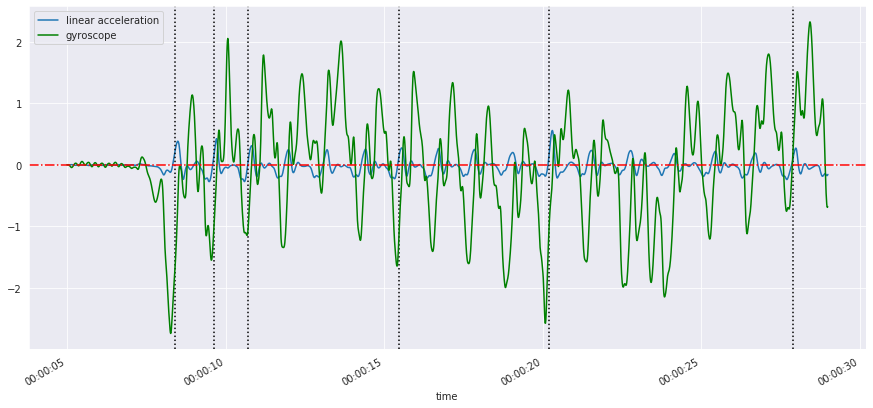

1fa674e9-2c49-4260-83f0-681ace2a5125
198459e0-6066-45ec-ade5-18b55c10cbb8
iPhone 8+; iOS/12.4
23.992891
Sampling rate is 100.0 Hz
mean: -0.05256988307802769
std: 0.038143517478429464
Sampling rate is 100.0 Hz


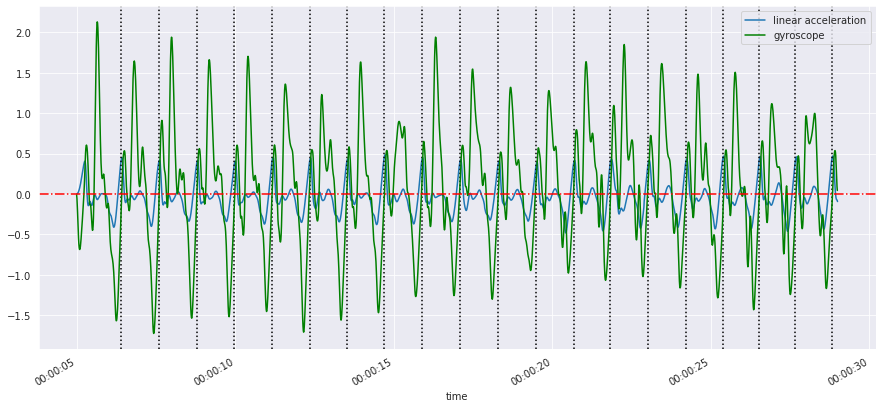

1fa674e9-2c49-4260-83f0-681ace2a5125
3cc91a34-a8b5-4027-9c48-dbd0101e1859
iPhone 8+; iOS/12.4
23.993949
Sampling rate is 100.0 Hz
mean: -0.013869452241720353
std: 0.005152235158429987
Sampling rate is 100.0 Hz


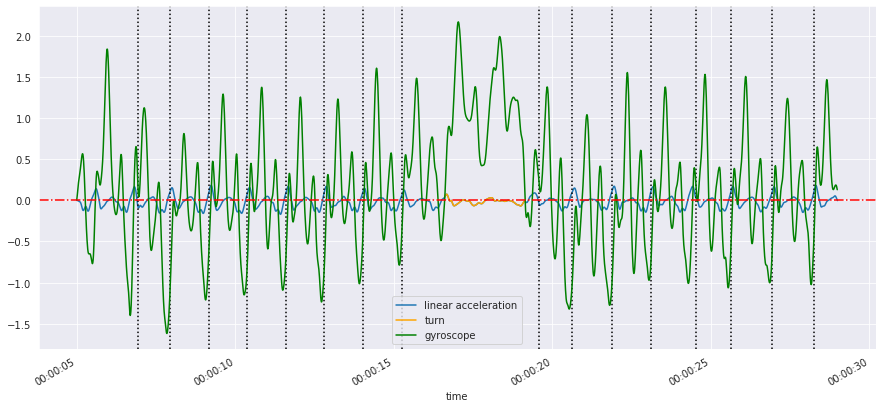

1fa674e9-2c49-4260-83f0-681ace2a5125
5ccf2425-3a3e-462c-bff5-0f27381075cf
iPhone 8+; iOS/12.4
23.990183583
Sampling rate is 100.0 Hz
mean: -0.0182260940439112
std: 0.005060480792793994
Sampling rate is 100.0 Hz


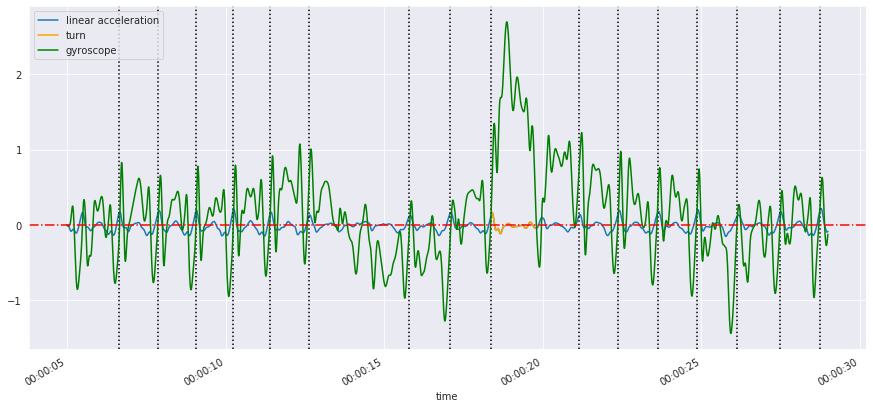

1fa674e9-2c49-4260-83f0-681ace2a5125
70a5df4e-de7d-4c75-99e8-adecd9162c52
iPhone 8+; iOS/12.4
23.989354749999997
Sampling rate is 100.0 Hz
mean: 0.01624294946966747
std: 0.006653427116956677
Sampling rate is 100.0 Hz


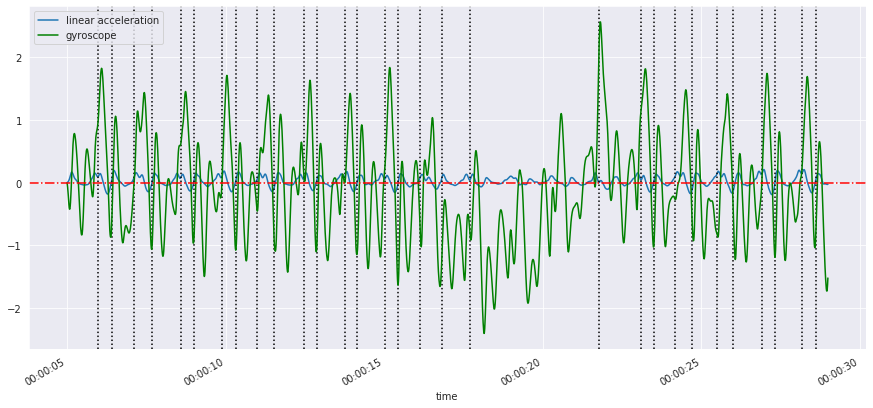

1fa674e9-2c49-4260-83f0-681ace2a5125
7c93c98e-cf42-44bf-82e7-afd2030443b7
iPhone 8+; iOS/12.4
23.985463250000002
Sampling rate is 100.0 Hz
mean: -0.02530677280721791
std: 0.010532271008040757
Sampling rate is 100.0 Hz


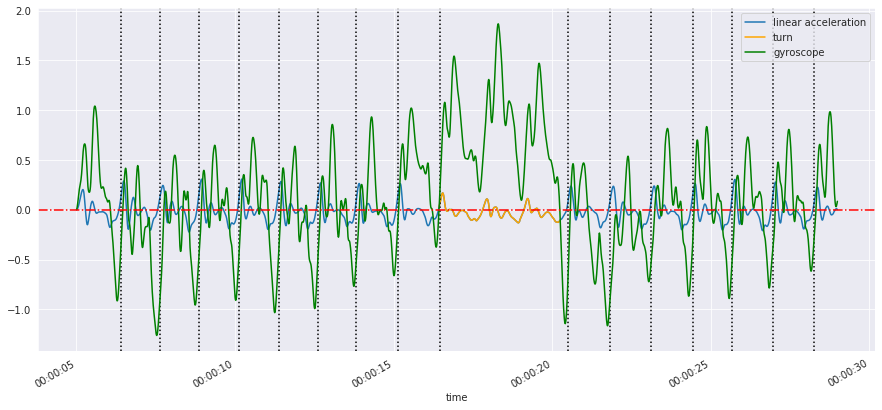

1fa674e9-2c49-4260-83f0-681ace2a5125
27bd027f-d0ed-4607-8976-ca55cf03d4b2
iPhone 8+; iOS/12.4
23.99038125
Sampling rate is 100.0 Hz
mean: -0.015392330828816367
std: 0.008307796090539157
Sampling rate is 100.0 Hz


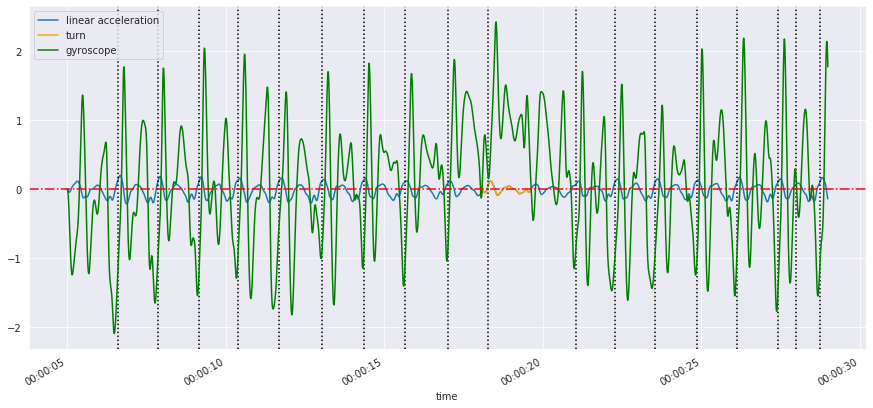

1fa674e9-2c49-4260-83f0-681ace2a5125
2e04b052-b9f0-4e9f-9704-79620b791659
iPhone 8+; iOS/12.4
23.993989125000002
Sampling rate is 100.0 Hz
mean: -0.030099113260996367
std: 0.0073824488234057305
Sampling rate is 100.0 Hz


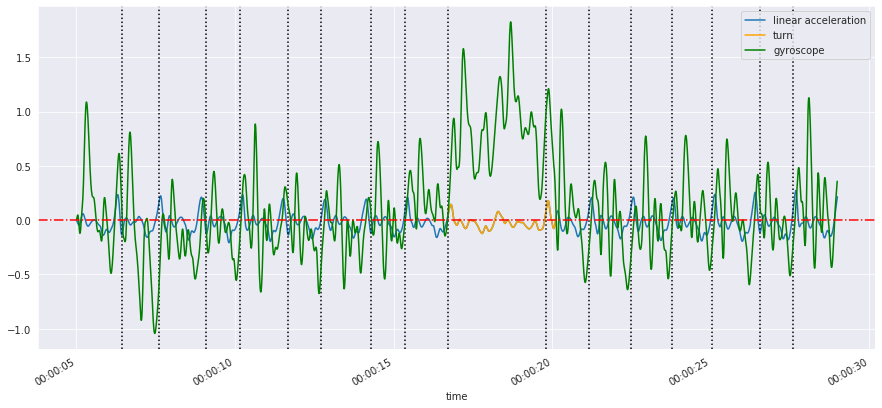

1fa674e9-2c49-4260-83f0-681ace2a5125
97ebf4c3-775d-4f63-b063-c95bb81f0f12
iPhone 8+; iOS/12.4
23.9911555
Sampling rate is 100.0 Hz
mean: -0.021287118696396785
std: 0.009080755708831122
Sampling rate is 100.0 Hz


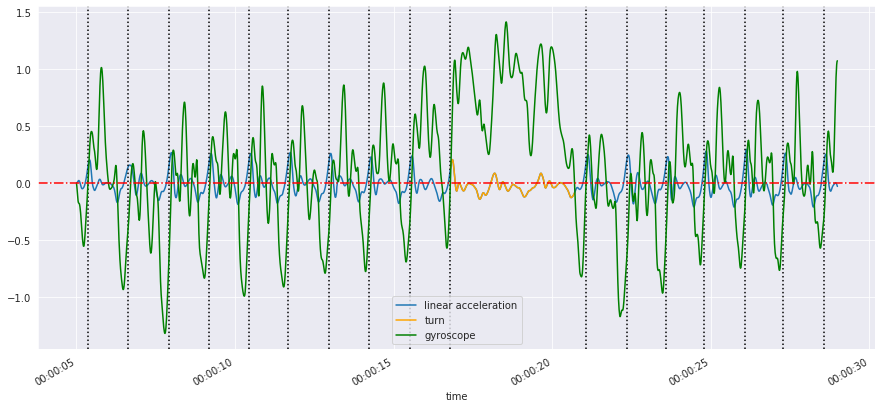

1fa674e9-2c49-4260-83f0-681ace2a5125
fde89e7c-7703-4d95-8956-2a76439a4252
iPhone 8+; iOS/12.4
23.992110375
Sampling rate is 100.0 Hz
mean: -0.02904246969846574
std: 0.005647841135584715
Sampling rate is 100.0 Hz


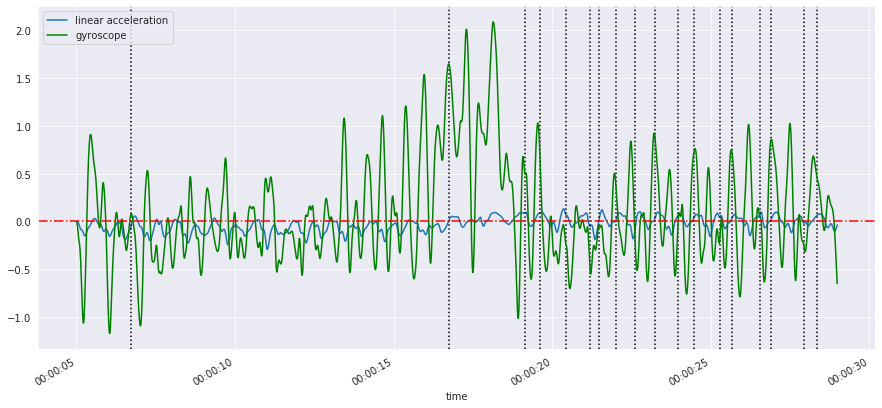

1fa674e9-2c49-4260-83f0-681ace2a5125
1f2cbef4-d502-4ba0-9119-33f490371ce0
iPhone 8+; iOS/12.4
23.993323500000002
Sampling rate is 100.0 Hz
mean: -0.0053520655678570474
std: 0.005531708985786822
Sampling rate is 100.0 Hz


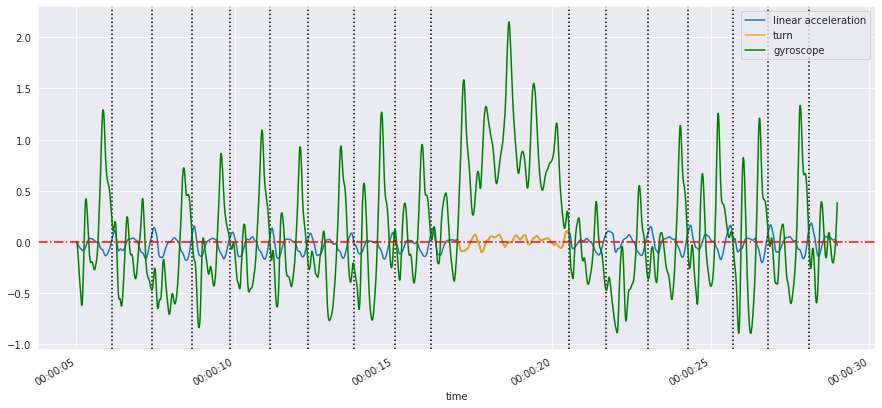

1fa674e9-2c49-4260-83f0-681ace2a5125
0ff5eeb3-3273-4ab1-bcff-f8b978fe93f6
iPhone 8+; iOS/12.4
23.9955315
Sampling rate is 100.0 Hz
mean: -0.025197515789942906
std: 0.013510987365911512
Sampling rate is 100.0 Hz


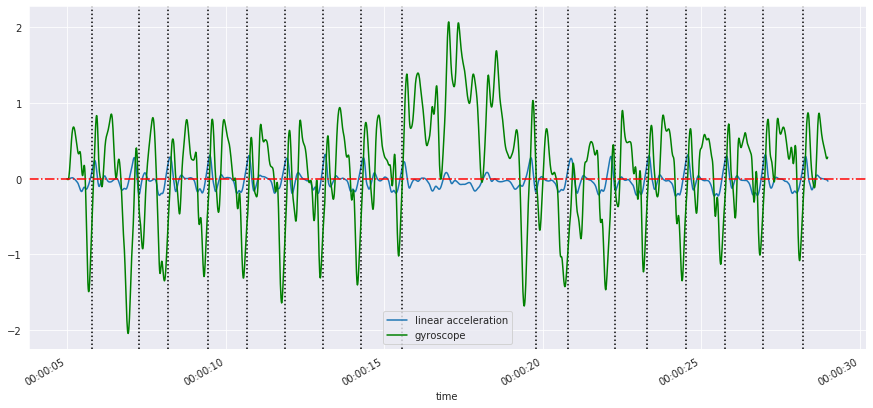

1fa674e9-2c49-4260-83f0-681ace2a5125
3c315cfc-1e71-4db7-b3fe-1c9058c727a0
iPhone 8+; iOS/12.4
23.989394083
Sampling rate is 100.0 Hz
mean: -0.02455019125632711
std: 0.010145718308904855
Sampling rate is 100.0 Hz


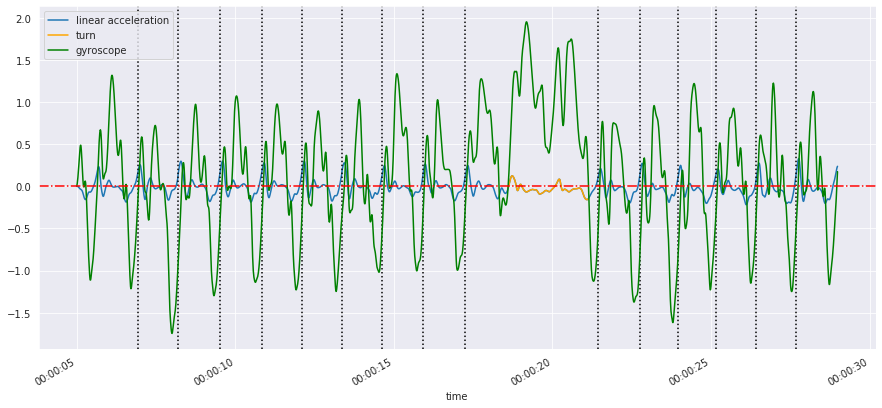

1fa674e9-2c49-4260-83f0-681ace2a5125
61bda356-2c77-4aa4-8c81-a0b06a7eeeaa
iPhone 8+; iOS/12.4
23.991329042
Sampling rate is 100.0 Hz
mean: -0.016362701229503878
std: 0.006032090752649467
Sampling rate is 100.0 Hz


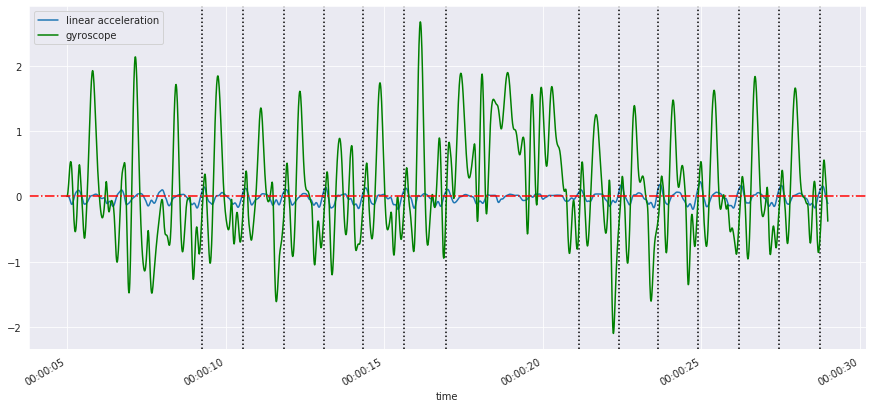

1fa674e9-2c49-4260-83f0-681ace2a5125
137bc4ab-ef72-472e-a4f6-c2a9f383aa63
iPhone 8+; iOS/12.4
23.990741
Sampling rate is 100.0 Hz
mean: -0.018817303555071222
std: 0.009054768147221602
Sampling rate is 100.0 Hz


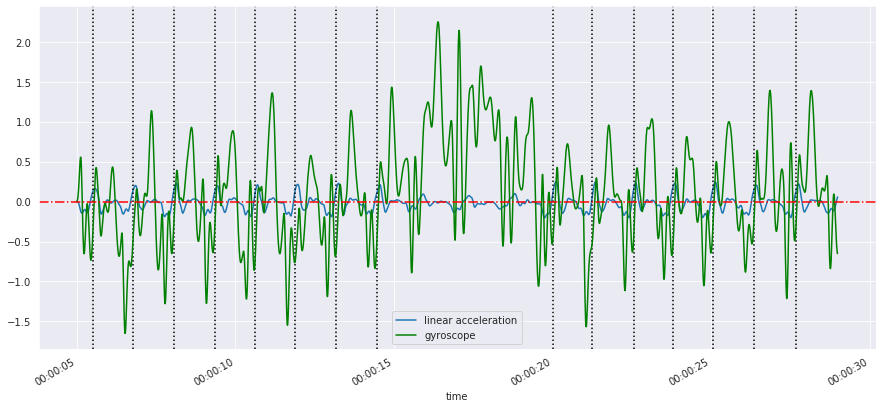

1fa674e9-2c49-4260-83f0-681ace2a5125
9df13f18-8579-45e6-aa87-eb02accf1e69
iPhone 8+; iOS/12.4
23.992679166000002
Sampling rate is 100.0 Hz
mean: -0.018274068594643592
std: 0.004037311492793139
Sampling rate is 100.0 Hz


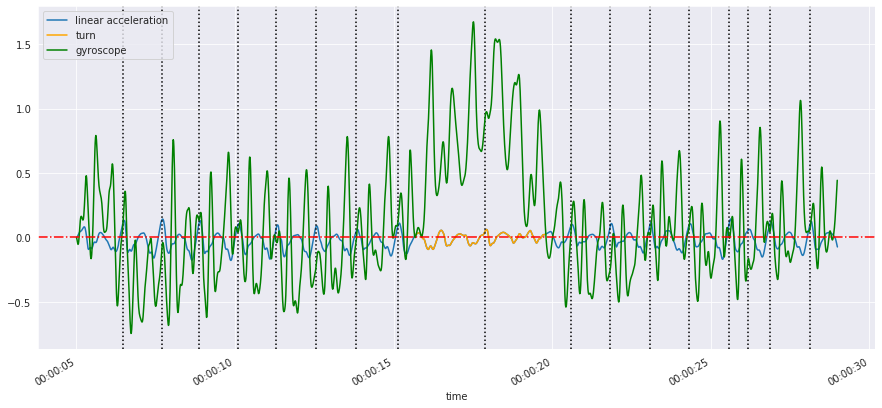

1fa674e9-2c49-4260-83f0-681ace2a5125
2d30fdcc-5507-4fc7-affb-3575705b9145
iPhone 8+; iOS/12.4.1
23.992419792
Sampling rate is 100.0 Hz
mean: -0.02439511687503479
std: 0.011445434016238298
Sampling rate is 100.0 Hz


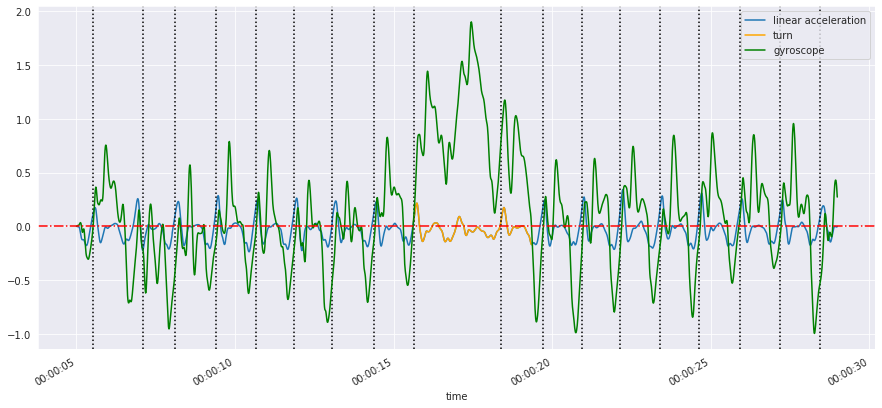

1fa674e9-2c49-4260-83f0-681ace2a5125
fb56dc71-1724-4be3-91f0-f6a75fda0133
iPhone 8+; iOS/12.4.1
23.992533332999997
Sampling rate is 100.0 Hz
mean: -0.025461083137550022
std: 0.012085607226205723
Sampling rate is 100.0 Hz


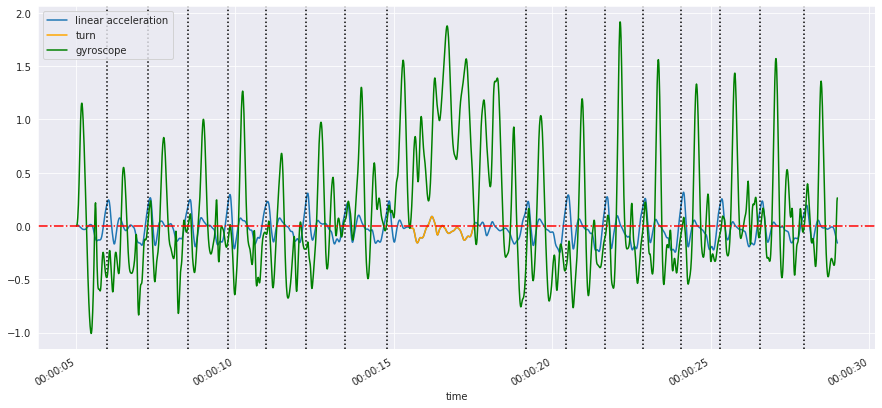

1fa674e9-2c49-4260-83f0-681ace2a5125
7348db33-d9df-4d14-9ad9-f1adbba670e7
iPhone 8+; iOS/12.4.1
23.99208275
Sampling rate is 100.0 Hz
mean: -0.016533658842501166
std: 0.006863852619880727
Sampling rate is 100.0 Hz


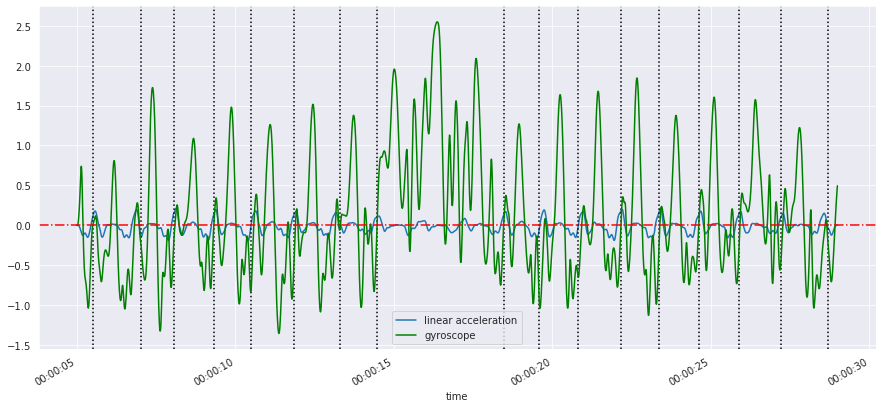

1fa674e9-2c49-4260-83f0-681ace2a5125
8389bd3a-9530-44d0-b6a9-91502eeb2ee4
iPhone 8+; iOS/12.4.1
23.992464625000004
Sampling rate is 100.0 Hz
mean: -0.017851179972851787
std: 0.004072592808881606
Sampling rate is 100.0 Hz


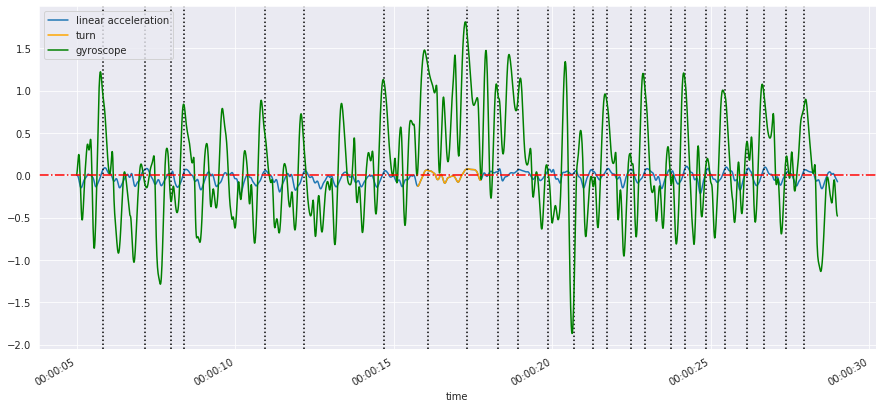

1fa674e9-2c49-4260-83f0-681ace2a5125
0de22d38-6f75-4b9f-abb1-90e2922de7c5
iPhone 8+; iOS/12.4.1
23.992733041999998
Sampling rate is 100.0 Hz
mean: -0.026233593023199105
std: 0.01083264074798564
Sampling rate is 100.0 Hz


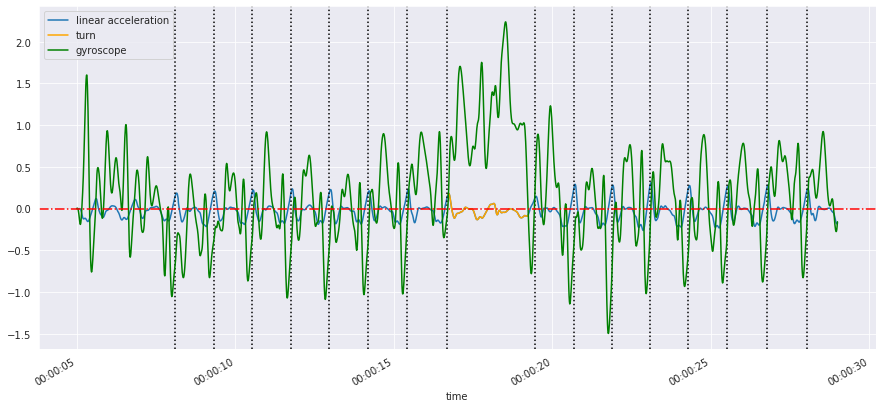

1fa674e9-2c49-4260-83f0-681ace2a5125
c094c12c-6e83-4322-977a-cd58dca7e3bb
iPhone 8+; iOS/12.4.1
23.990227208
Sampling rate is 100.0 Hz
mean: -0.022682083820441408
std: 0.003558511238157789
Sampling rate is 100.0 Hz


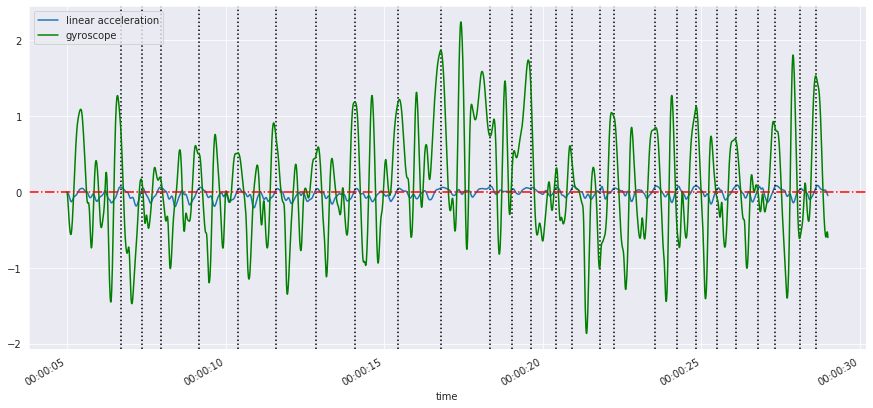

1fa674e9-2c49-4260-83f0-681ace2a5125
c4e57b98-5b59-4be0-9ec1-b520548432e6
iPhone 8+; iOS/12.4.1
23.991785
Sampling rate is 100.0 Hz
mean: -0.018281654953991186
std: 0.021086488730795994
Sampling rate is 100.0 Hz


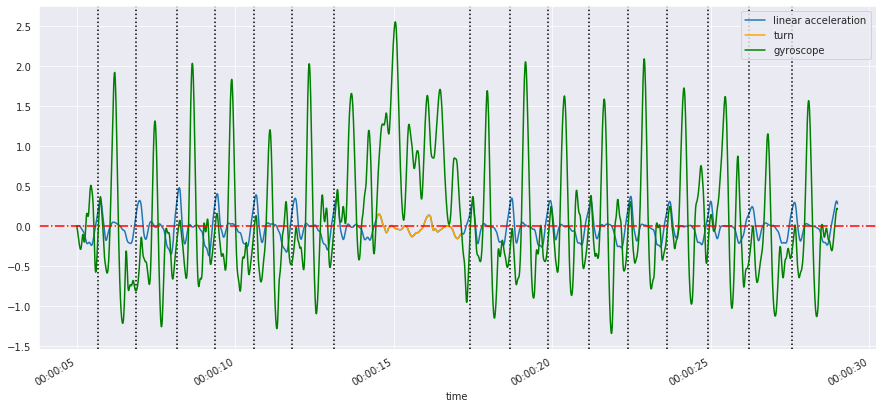

1fa674e9-2c49-4260-83f0-681ace2a5125
1d5dbe94-42fc-4e3f-b8e2-682bbc10c8d2
iPhone 8+; iOS/12.4.1
23.99057725
Sampling rate is 100.0 Hz
mean: -0.031215694052546865
std: 0.015194836075613217
Sampling rate is 100.0 Hz


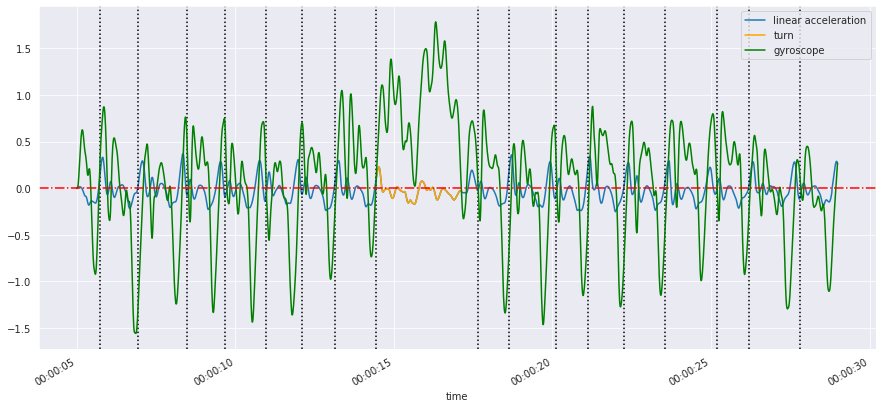

1fa674e9-2c49-4260-83f0-681ace2a5125
cbacc555-6e13-45c6-a92e-ffdfda9256de
iPhone 8+; iOS/12.4.1
23.992690791
Sampling rate is 100.0 Hz
mean: -0.03231954019099355
std: 0.01283363252963408
Sampling rate is 100.0 Hz


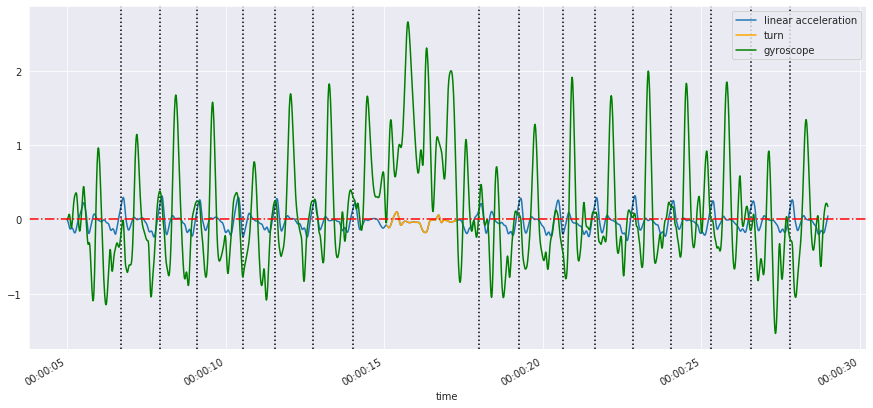

1fa674e9-2c49-4260-83f0-681ace2a5125
00b46108-3363-492f-812a-45d4102bdd0f
iPhone 8+; iOS/12.4.1
23.989419
Sampling rate is 100.0 Hz
mean: -0.026802787051639604
std: 0.014169298216300445
Sampling rate is 100.0 Hz


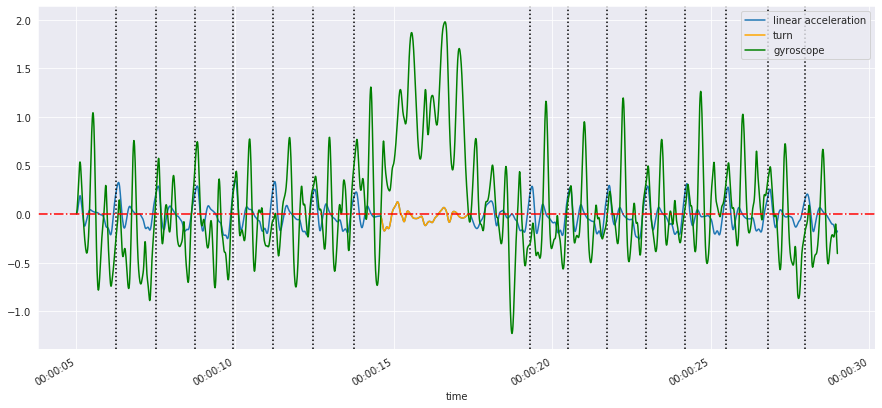

1fa674e9-2c49-4260-83f0-681ace2a5125
53bc6ac4-c458-4bef-bd28-64dd86721acd
iPhone 8+; iOS/13.0
23.992207750000002
Sampling rate is 100.0 Hz
mean: -0.007461681037661856
std: 0.005995752924195016
Sampling rate is 100.0 Hz


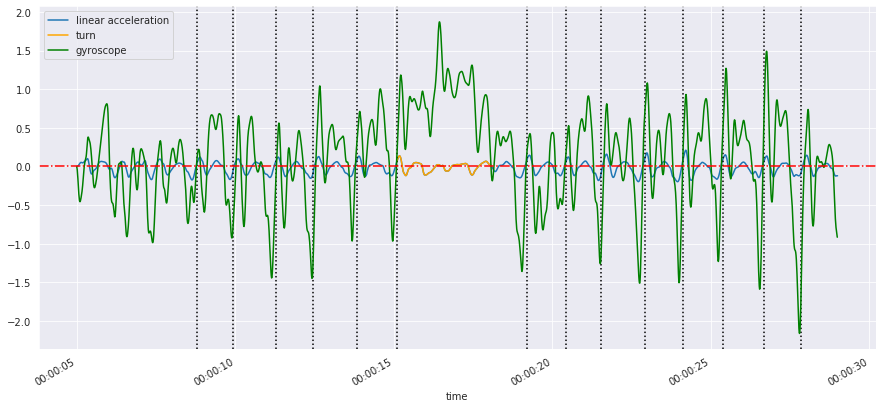

1fa674e9-2c49-4260-83f0-681ace2a5125
ff6ede77-c39a-44e9-8134-8d3d2d31ae88
iPhone 8+; iOS/13.0
23.983163376
Sampling rate is 100.0 Hz
mean: -0.010292475845769412
std: 0.007369589084571704
Sampling rate is 100.0 Hz


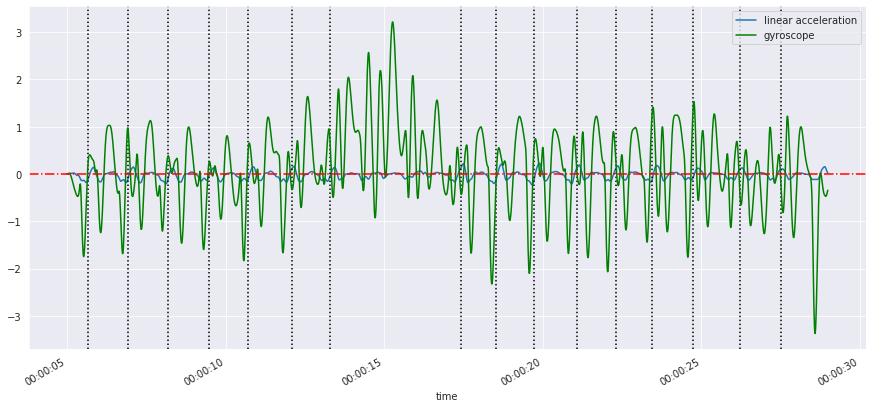

1fa674e9-2c49-4260-83f0-681ace2a5125
0aabeab4-2911-459b-8a70-9e11d1072c05
iPhone 8+; iOS/13.0
23.98937225
Sampling rate is 100.0 Hz
mean: -0.011436462903548177
std: 0.004121448260634853
Sampling rate is 100.0 Hz


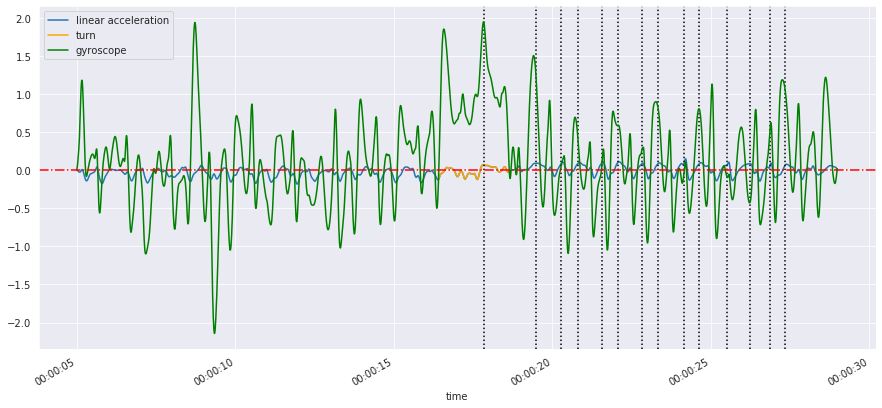

1fa674e9-2c49-4260-83f0-681ace2a5125
f91bf926-08cb-429c-a314-eae22faa414d
iPhone 8+; iOS/13.0
23.990253374999998
Sampling rate is 100.0 Hz
mean: -0.028347000082903608
std: 0.009825430562519373
Sampling rate is 100.0 Hz


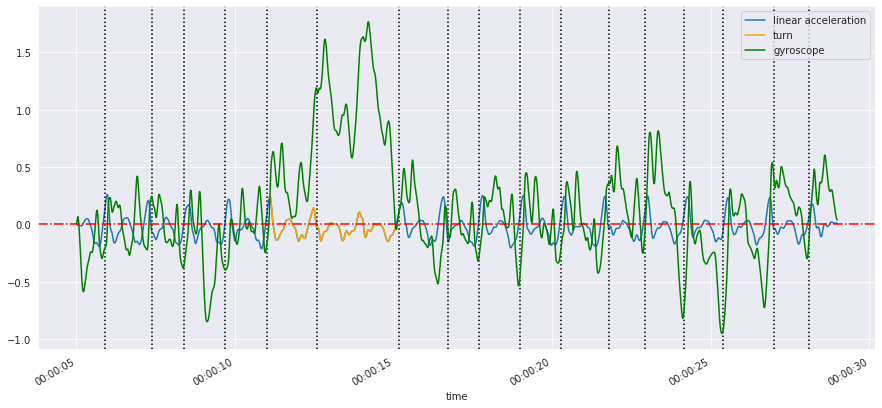

1fa674e9-2c49-4260-83f0-681ace2a5125
d6bf36cd-df31-4f1c-bb89-5ddcaa6fc9f2
iPhone 8+; iOS/13.1
23.981729875
Sampling rate is 100.0 Hz
mean: -0.014116208944599943
std: 0.0036894337268795494
Sampling rate is 100.0 Hz


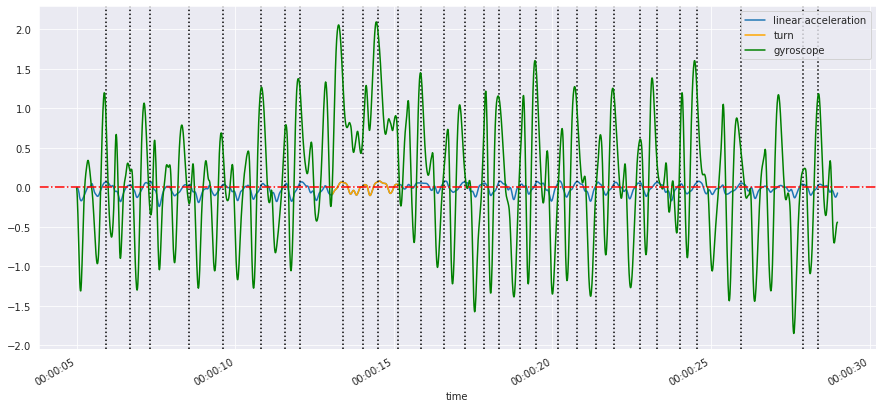

1fa674e9-2c49-4260-83f0-681ace2a5125
82c6ea8c-90fc-48e6-ac4a-a21563a6c262
iPhone 8+; iOS/13.1
23.990429625
Sampling rate is 100.0 Hz
mean: -0.019847374103609282
std: 0.008185807860748883
Sampling rate is 100.0 Hz


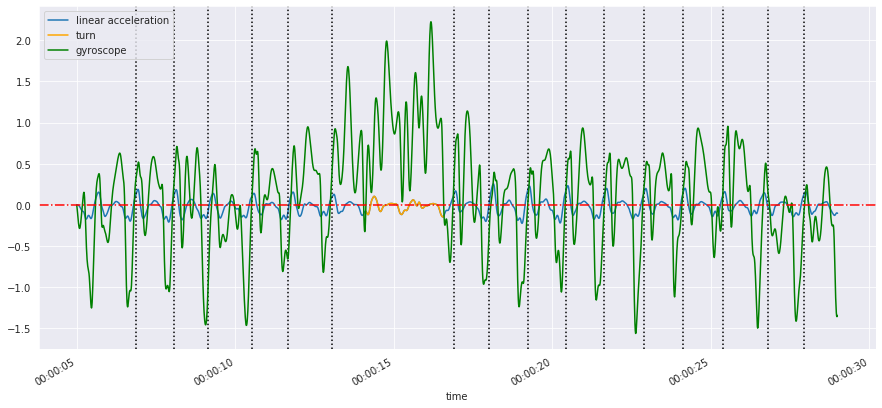

1fa674e9-2c49-4260-83f0-681ace2a5125
29e5b2db-56ea-46f8-a4df-0cdcfc9e8cbc
iPhone 8+; iOS/13.1.1
23.983931540999997
Sampling rate is 99.95833333333333 Hz
mean: -0.030867355468447284
std: 0.021791579177339357
Sampling rate is 99.95833333333333 Hz


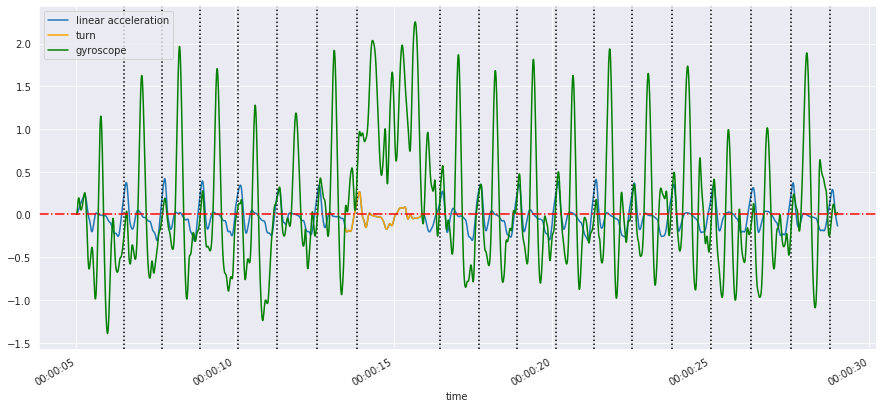

1fa674e9-2c49-4260-83f0-681ace2a5125
ec6b5b2f-548f-4107-9946-9b50110acbaa
iPhone 8+; iOS/13.1.1
23.990511375
Sampling rate is 100.0 Hz
mean: -0.01249150926463468
std: 0.003976845948219672
Sampling rate is 100.0 Hz


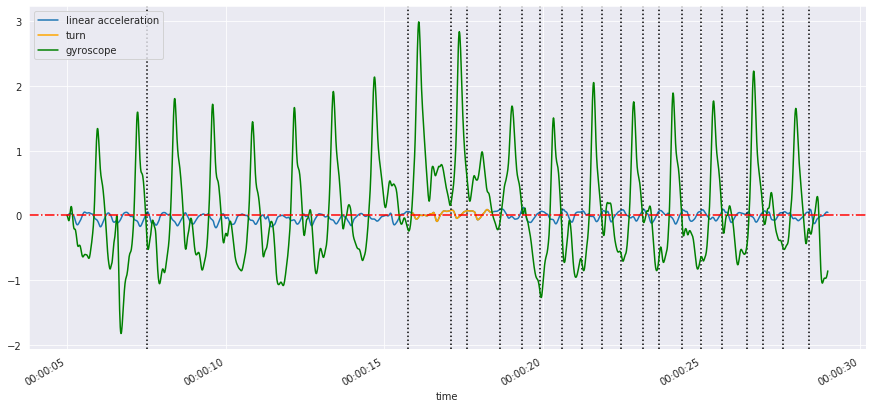

1fa674e9-2c49-4260-83f0-681ace2a5125
3abf7c19-d4e1-4b70-bd95-9169111dac0f
iPhone 8+; iOS/13.1.1
23.980810583999997
Sampling rate is 100.0 Hz
mean: -0.027775579075609028
std: 0.012281248479791168
Sampling rate is 100.0 Hz


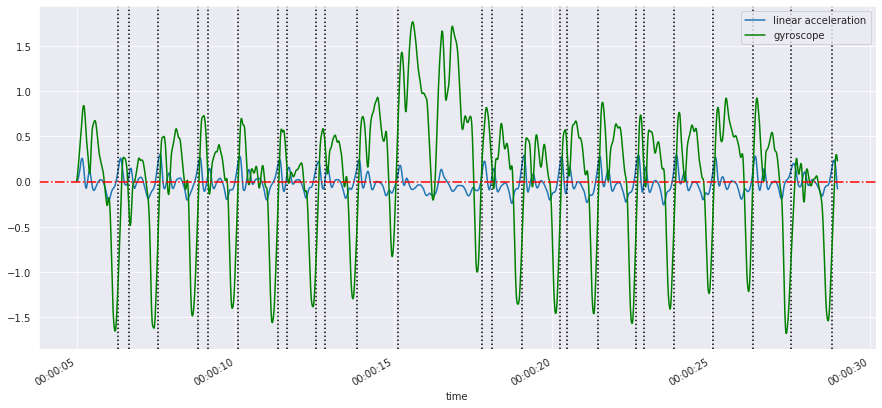

1fa674e9-2c49-4260-83f0-681ace2a5125
f3b45d2f-97c1-492b-812d-e0495362a3b2
iPhone 8+; iOS/13.1.2
23.9907405
Sampling rate is 100.0 Hz
mean: -0.01633245763272733
std: 0.003780867385822904
Sampling rate is 100.0 Hz


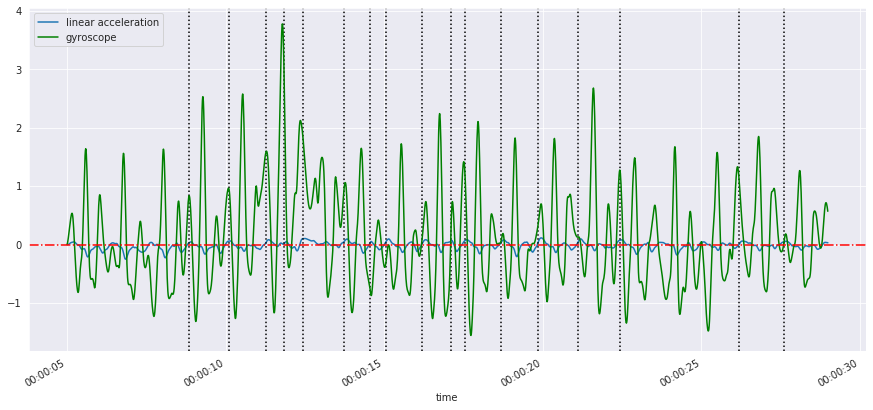

1fa674e9-2c49-4260-83f0-681ace2a5125
df925885-538a-4f67-84e9-9166b953410b
iPhone 8+; iOS/13.1.2
23.980763
Sampling rate is 100.0 Hz
mean: -0.01915599033867696
std: 0.004874203109848986
Sampling rate is 100.0 Hz


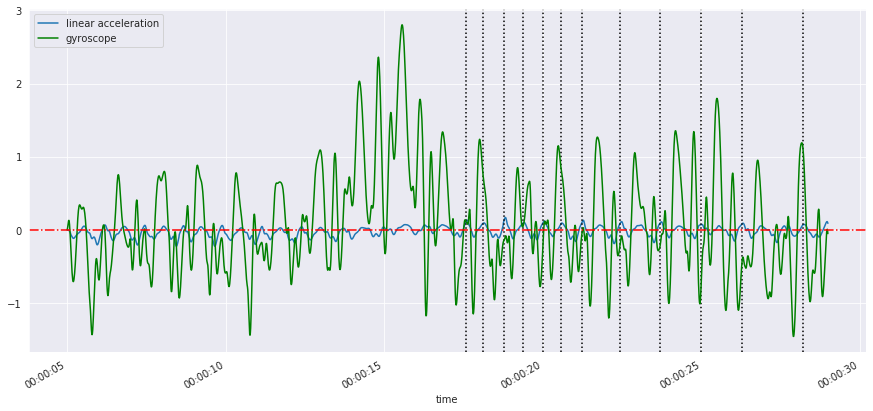

1fa674e9-2c49-4260-83f0-681ace2a5125
81628baa-607b-4b17-9e0a-b274cc568ee0
iPhone 8+; iOS/13.1.2
23.983519542
Sampling rate is 100.0 Hz
mean: -0.00533560465418595
std: 0.0039537167063250014
Sampling rate is 100.0 Hz


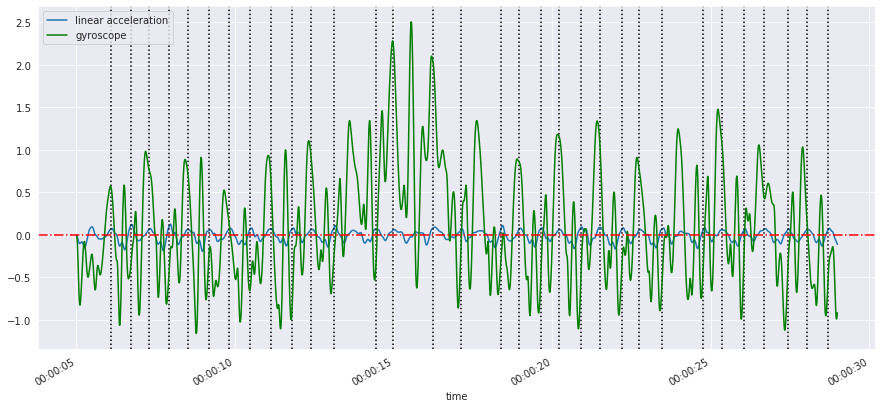

1fa674e9-2c49-4260-83f0-681ace2a5125
acf2621a-73f8-47a4-a8e9-39e76a35e0ea
iPhone 8+; iOS/13.1.2
23.981201583999997
Sampling rate is 100.0 Hz
mean: -0.04139972080543056
std: 0.014393431006318149
Sampling rate is 100.0 Hz


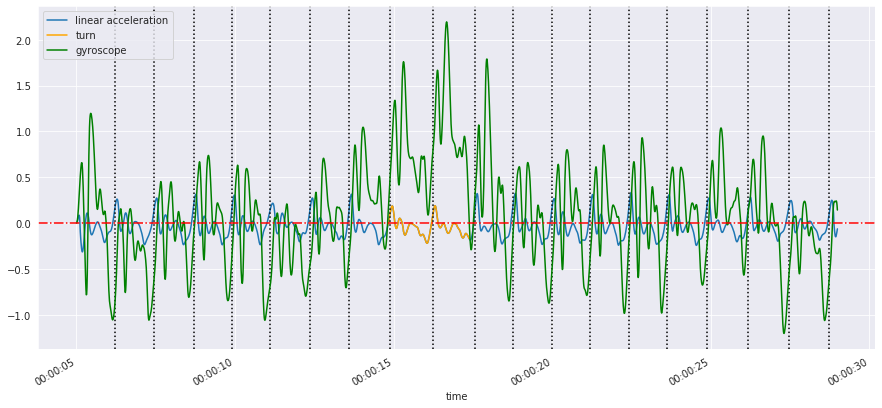

1fa674e9-2c49-4260-83f0-681ace2a5125
63af6fd2-6ec4-49d6-a596-b21fd4602c98
iPhone 8+; iOS/13.1.2
23.980762709
Sampling rate is 100.0 Hz
mean: -0.032736260507048406
std: 0.010155781762503906
Sampling rate is 100.0 Hz


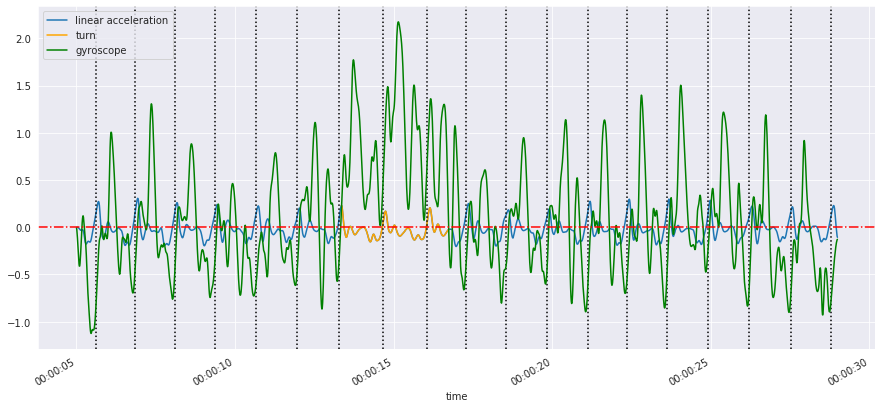

1fa674e9-2c49-4260-83f0-681ace2a5125
0b644eca-525a-48e3-bab3-ecf4883d68dc
iPhone 8+; iOS/13.1.2
23.982498874999997
Sampling rate is 100.0 Hz
mean: -0.03585654843516172
std: 0.012695270931999228
Sampling rate is 100.0 Hz


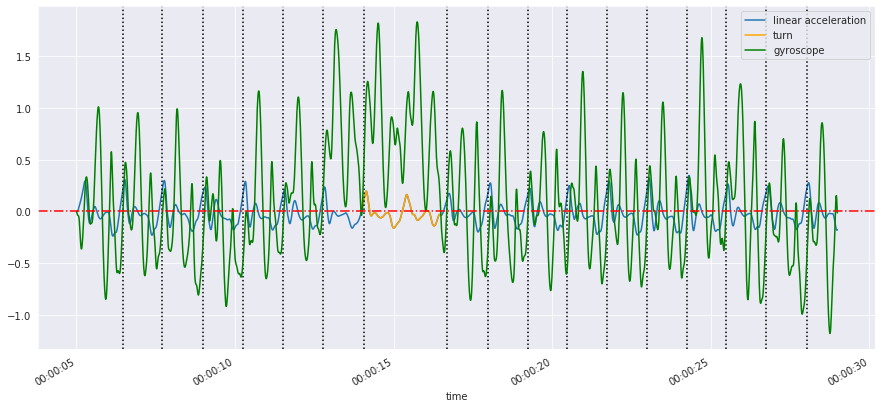

1fa674e9-2c49-4260-83f0-681ace2a5125
37f09552-0a13-4f72-a305-bb9b98de4830
iPhone 8+; iOS/13.1.2
23.981008251
Sampling rate is 100.0 Hz
mean: -0.007866247707007192
std: 0.006219377389853516
Sampling rate is 100.0 Hz


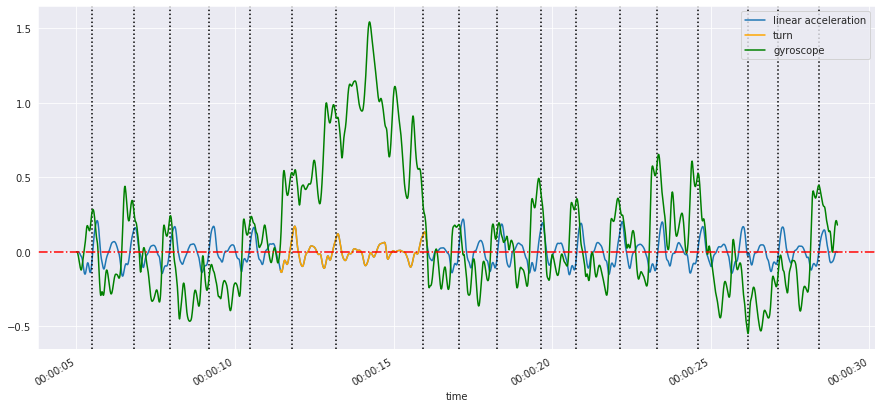

1fa674e9-2c49-4260-83f0-681ace2a5125
e55c87f1-622e-4443-8d99-3028264a2280
iPhone 8+; iOS/13.1.2
23.990643166999998
Sampling rate is 100.0 Hz
mean: -0.037967586594819774
std: 0.013793191260381336
Sampling rate is 100.0 Hz


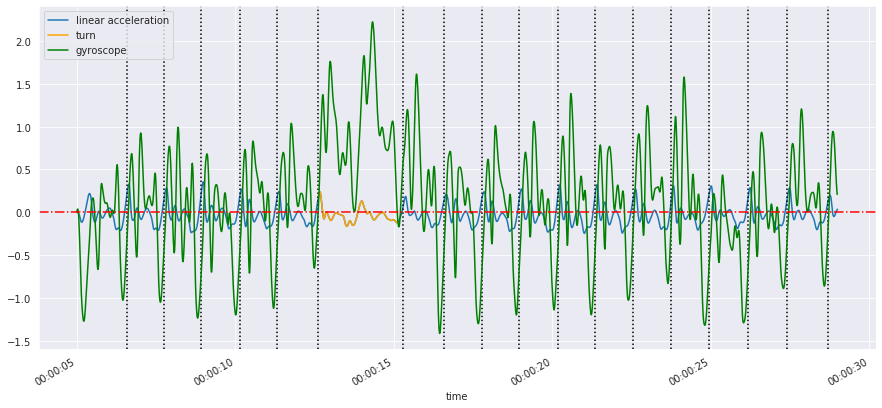

1fa674e9-2c49-4260-83f0-681ace2a5125
acc3e613-4c37-450e-bc75-e187ef66826b
iPhone 8+; iOS/13.1.2
23.99033025
Sampling rate is 100.0 Hz
mean: -0.017285593584535967
std: 0.0028003528483911966
Sampling rate is 100.0 Hz


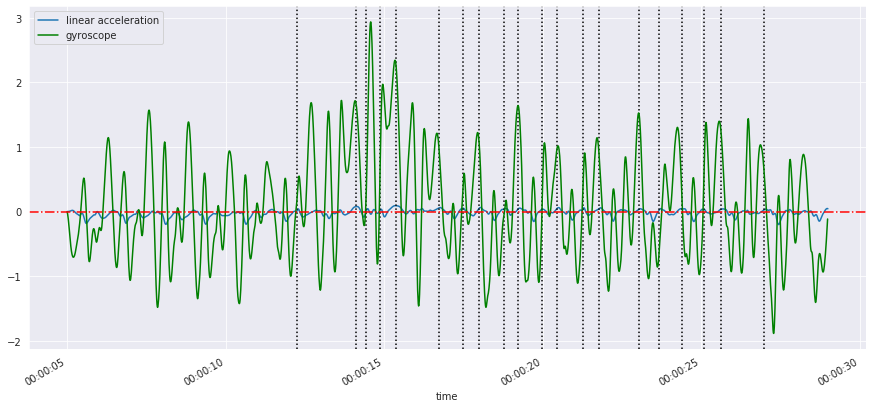

1fa674e9-2c49-4260-83f0-681ace2a5125
0165a74f-8405-43d3-bf17-74e3081bec84
iPhone 8+; iOS/13.1.2
23.991359791
Sampling rate is 100.0 Hz
mean: -0.0323399883773071
std: 0.0094900065167896
Sampling rate is 100.0 Hz


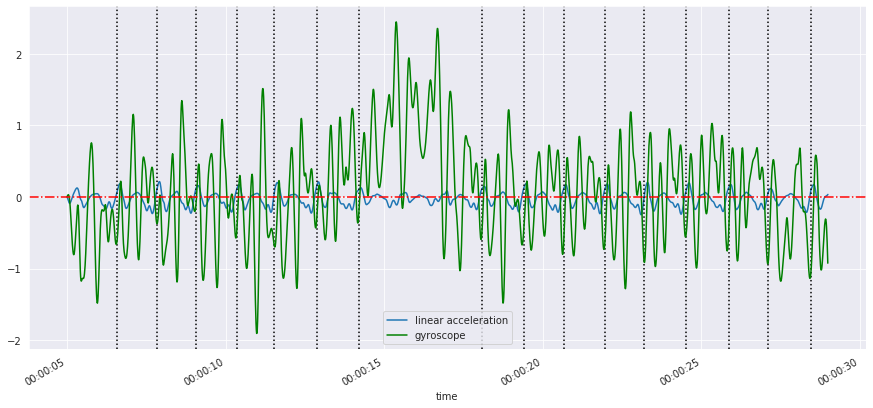

1fa674e9-2c49-4260-83f0-681ace2a5125
037626c0-5ba3-4d18-b50c-15c455c4447f
iPhone 8+; iOS/13.1.2
23.983743125
Sampling rate is 100.0 Hz
mean: -0.02352068940632051
std: 0.00905756823264423
Sampling rate is 100.0 Hz


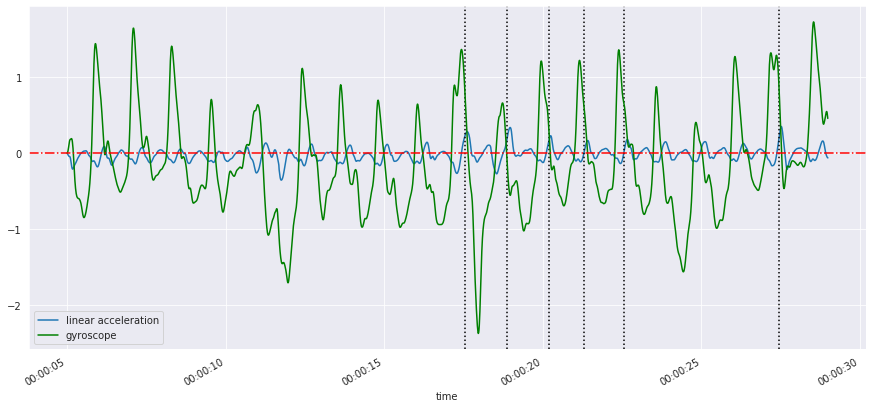

1fa674e9-2c49-4260-83f0-681ace2a5125
646d42a0-5fa1-4be3-b0f2-112945c82471
iPhone 8+; iOS/13.1.2
23.996208375
Sampling rate is 100.0 Hz
mean: -0.012930477085976826
std: 0.005055812605406833
Sampling rate is 100.0 Hz


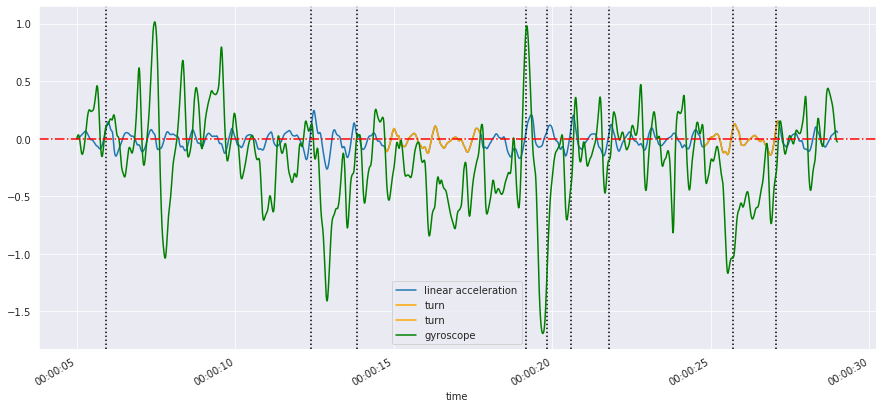

1fa674e9-2c49-4260-83f0-681ace2a5125
d71a89a2-e827-4c37-b1c8-fca2adbe1a8d
iPhone 8+; iOS/13.1.3
23.98772975
Sampling rate is 100.0 Hz
mean: -0.013553462986360239
std: 0.005700590085599801
Sampling rate is 100.0 Hz


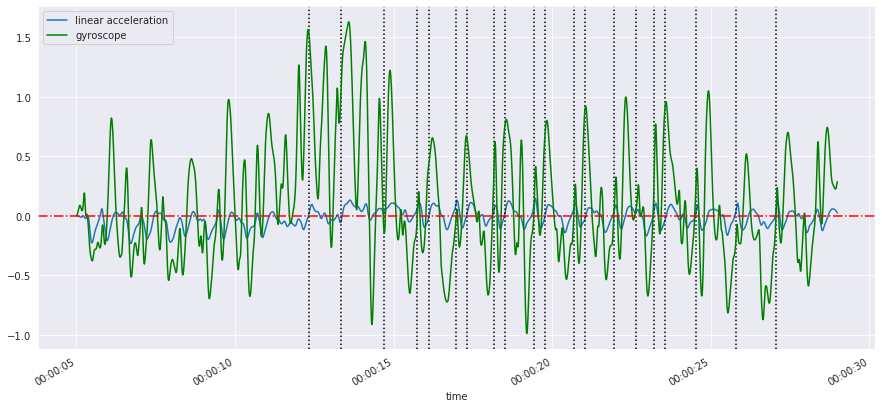

1fa674e9-2c49-4260-83f0-681ace2a5125
0a27ab7f-27e3-4b66-8132-766fc6a4dd4e
iPhone 8+; iOS/13.1.3
23.993553
Sampling rate is 100.0 Hz
mean: -0.01932334149676433
std: 0.007782292121009734
Sampling rate is 100.0 Hz


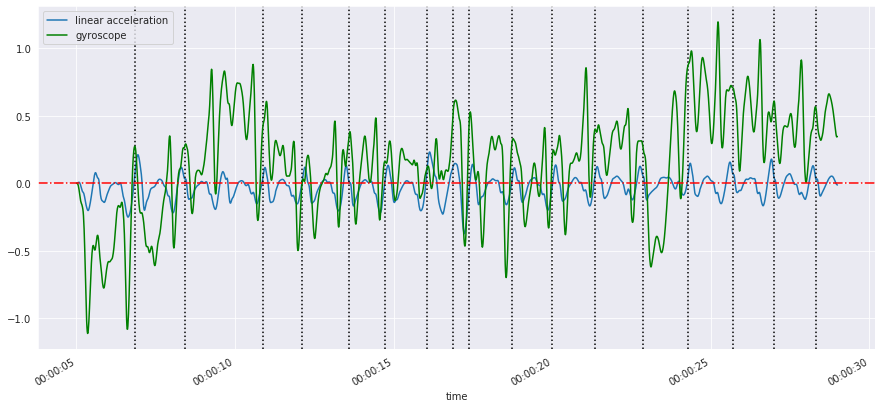

1fa674e9-2c49-4260-83f0-681ace2a5125
111b83ca-264a-409e-97f9-f3c1a4af2311
iPhone 8+; iOS/13.1.3
23.990967499999996
Sampling rate is 100.0 Hz
mean: -0.0033513481447532707
std: 0.004422595161778441
Sampling rate is 100.0 Hz


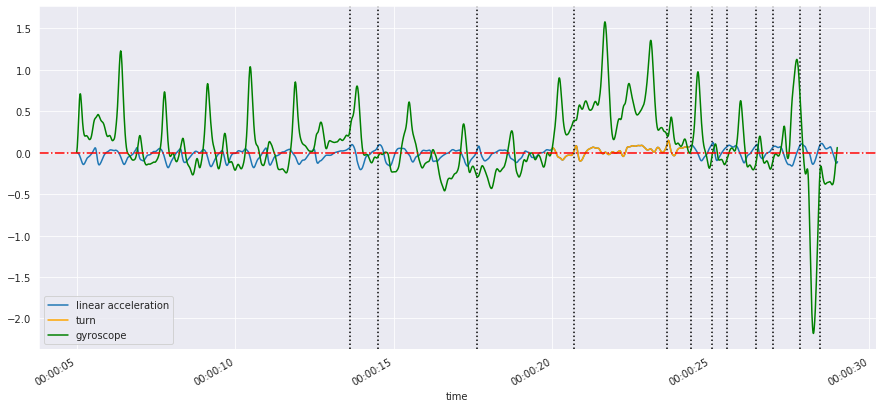

1fa674e9-2c49-4260-83f0-681ace2a5125
3a19b3ea-782b-4d05-bf1c-fe9a83604a21
iPhone 8+; iOS/13.1.3
23.990204625
Sampling rate is 100.0 Hz
mean: -0.020305465283299115
std: 0.010056531481158103
Sampling rate is 100.0 Hz


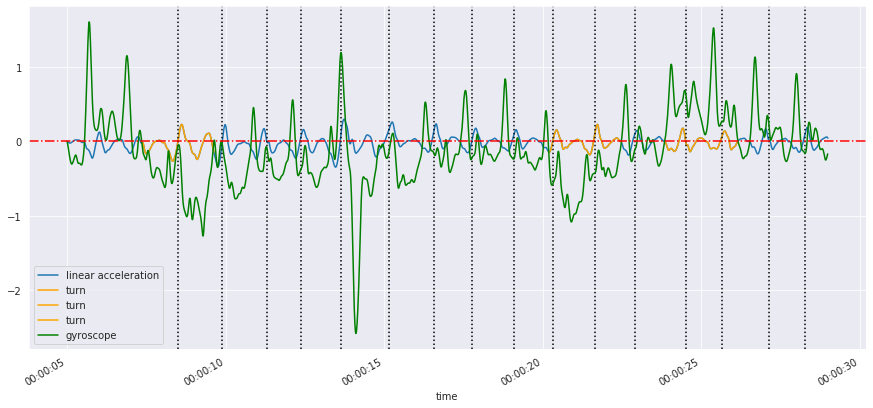

1fa674e9-2c49-4260-83f0-681ace2a5125
99e5750b-cdf4-4bf3-9587-7d9faa7c1b9a
iPhone 8+; iOS/13.1.3
23.991545459
Sampling rate is 100.0 Hz
mean: -0.03252206086214167
std: 0.011929265123740238
Sampling rate is 100.0 Hz


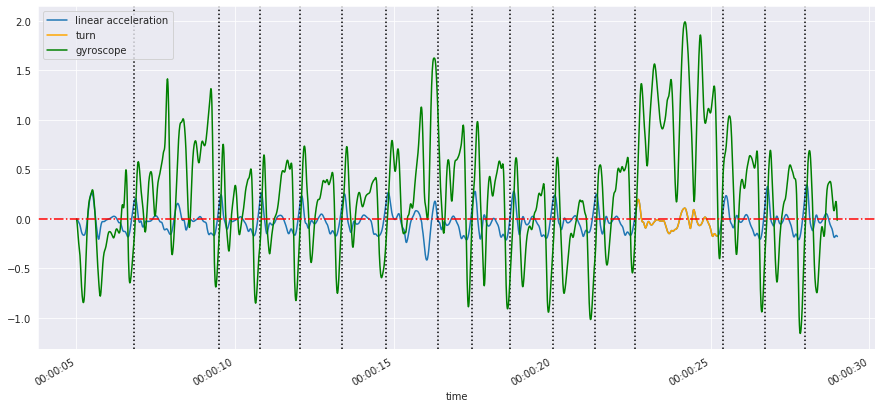

1fa674e9-2c49-4260-83f0-681ace2a5125
3bf67365-c66a-4d9f-a0c3-36a31465962a
iPhone 8+; iOS/13.1.3
23.991149749999998
Sampling rate is 100.0 Hz
mean: -0.00949326351056724
std: 0.007764442172224353
Sampling rate is 100.0 Hz


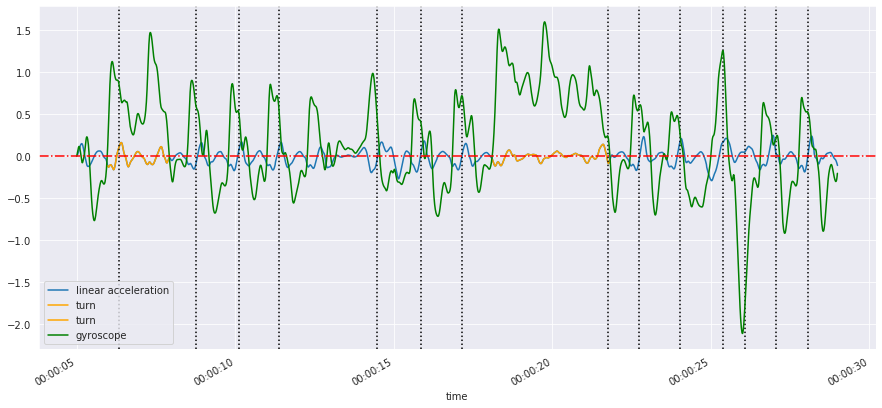

1fa674e9-2c49-4260-83f0-681ace2a5125
350b2b01-25d8-4649-b79b-7de99ea84d7e
iPhone 8+; iOS/13.1.3
23.982589916000002
Sampling rate is 100.0 Hz
mean: -0.02807238213130528
std: 0.008123161471580749
Sampling rate is 100.0 Hz


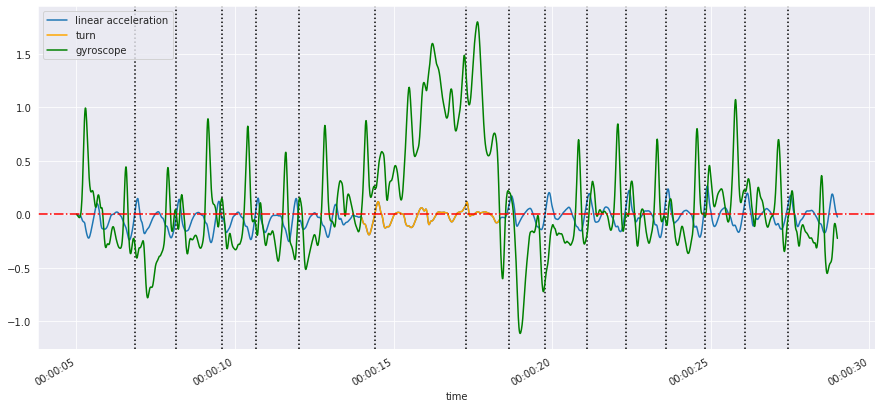

1fa674e9-2c49-4260-83f0-681ace2a5125
47ad837f-cbcc-4ac9-a0c6-52d566ca0c17
iPhone 8+; iOS/13.1.3
23.981328292
Sampling rate is 100.0 Hz
mean: -0.01970338883857855
std: 0.007707025319423265
Sampling rate is 100.0 Hz


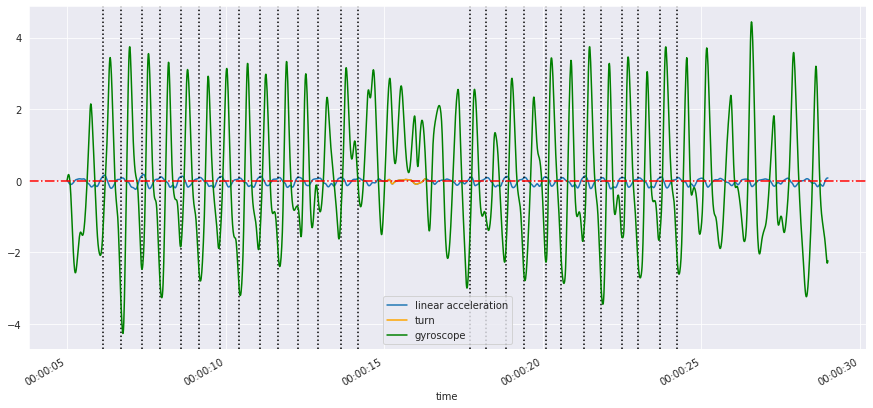

1fa674e9-2c49-4260-83f0-681ace2a5125
0b48de58-04df-44a1-8d27-793880b4c4ae
iPhone 8+; iOS/13.2
23.991274417
Sampling rate is 100.0 Hz
mean: -0.0026481101682733423
std: 0.00914183497839318
Sampling rate is 100.0 Hz


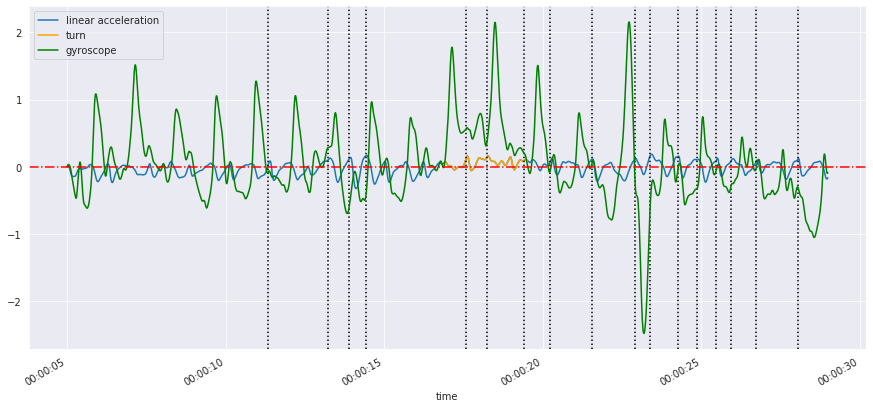

1fa674e9-2c49-4260-83f0-681ace2a5125
78de9fb8-1dcb-4728-8223-4fa13d67cee6
iPhone 8+; iOS/13.2
23.991109125
Sampling rate is 100.0 Hz
mean: -0.01179442710231633
std: 0.008277038884581601
Sampling rate is 100.0 Hz


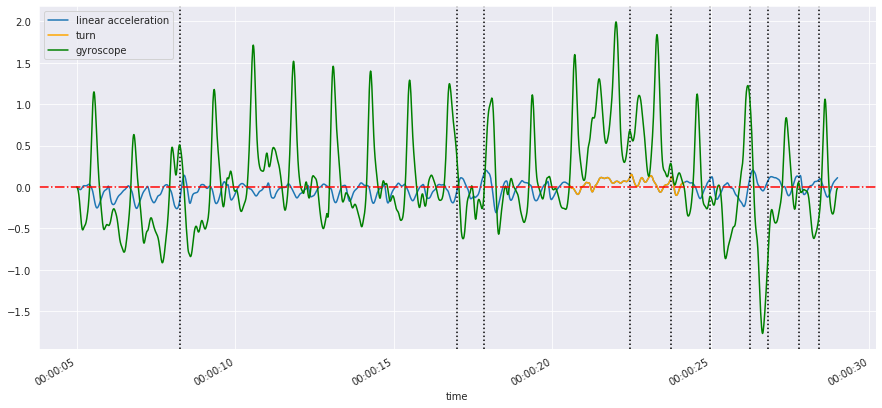

1fa674e9-2c49-4260-83f0-681ace2a5125
fbee5678-0318-4e86-8383-73efa4183611
iPhone 8+; iOS/13.2
23.994059
Sampling rate is 100.0 Hz
mean: -0.016922332746712856
std: 0.009578363126973674
Sampling rate is 100.0 Hz


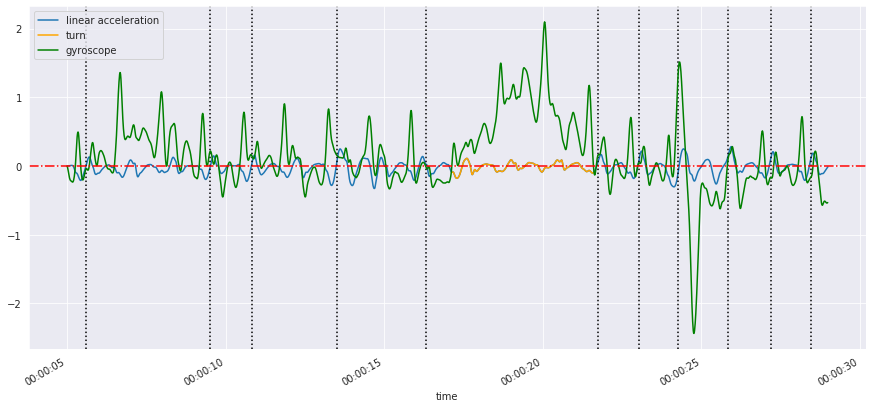

1fa674e9-2c49-4260-83f0-681ace2a5125
d05bb41f-d6e9-495b-90f6-78e16493ef98
iPhone 8+; iOS/13.2
23.9896635
Sampling rate is 100.0 Hz
mean: -0.02288588935657993
std: 0.009283861256307703
Sampling rate is 100.0 Hz


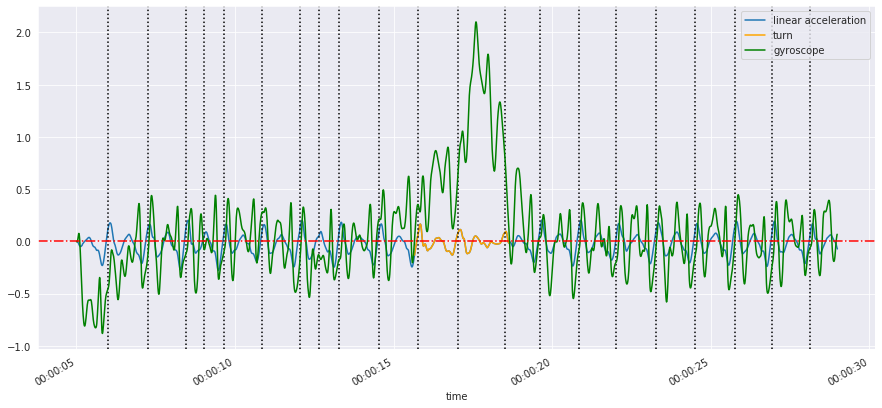

1fa674e9-2c49-4260-83f0-681ace2a5125
a6af785b-89d6-49a0-9825-e94101f3249a
iPhone 8+; iOS/13.2
23.993102667
Sampling rate is 100.0 Hz
mean: -0.02823962338822516
std: 0.008349343449124918
Sampling rate is 100.0 Hz


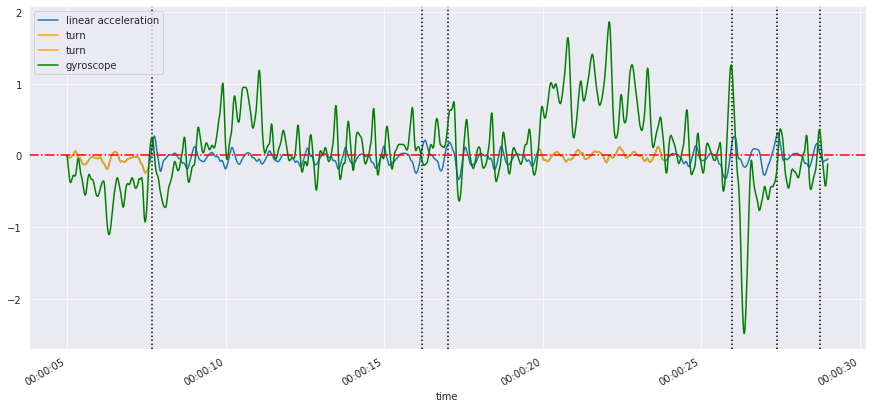

1fa674e9-2c49-4260-83f0-681ace2a5125
0e1aef96-4a51-41bf-94d9-b8ac796c774a
iPhone 8+; iOS/13.2
23.983847291
Sampling rate is 99.95833333333333 Hz
mean: -0.024038283966599988
std: 0.0038706422331360804
Sampling rate is 99.95833333333333 Hz


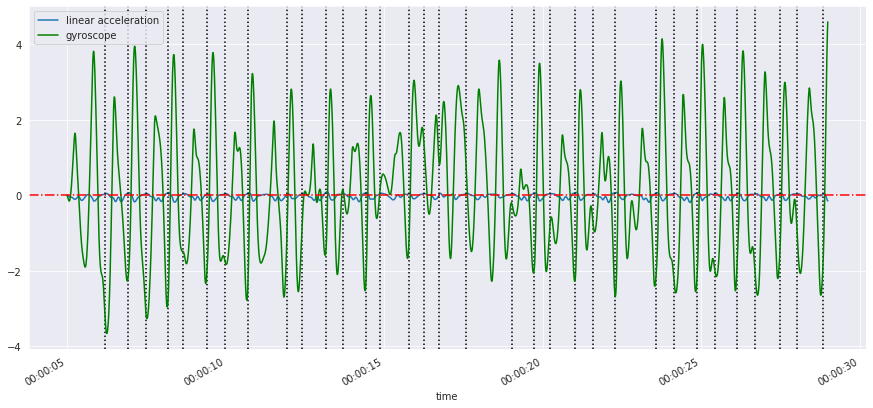

1fa674e9-2c49-4260-83f0-681ace2a5125
4a65121c-4207-44d9-a8be-bf1889284229
iPhone 8+; iOS/13.2
23.98083975
Sampling rate is 100.0 Hz
mean: -0.010886978905100805
std: 0.005968953827938348
Sampling rate is 100.0 Hz


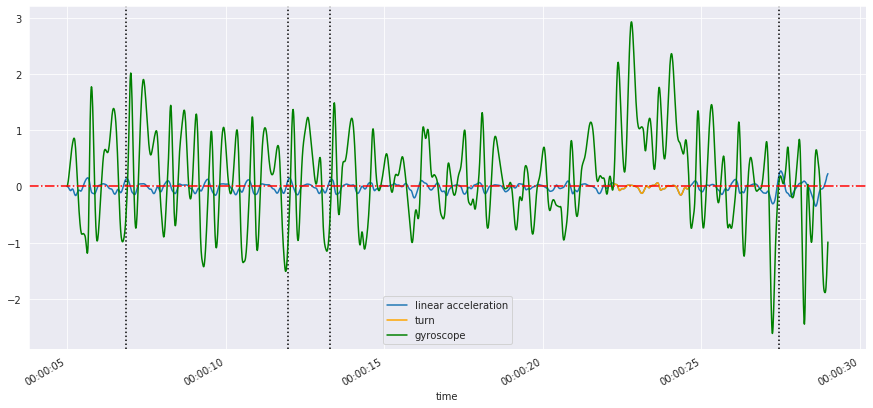

1fa674e9-2c49-4260-83f0-681ace2a5125
04f1e9f9-9b95-4158-992e-94d31613ce4c
iPhone 8+; iOS/13.2
23.982824667
Sampling rate is 100.0 Hz
mean: -0.012170189154011347
std: 0.00893797677600011
Sampling rate is 100.0 Hz


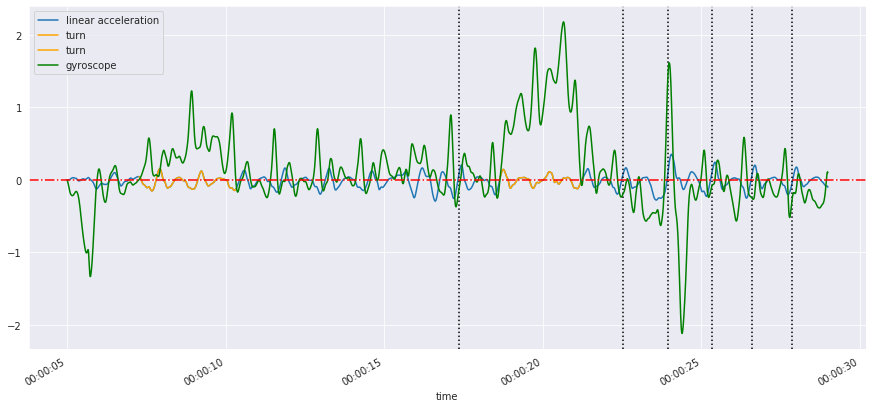

1fa674e9-2c49-4260-83f0-681ace2a5125
1f11cc30-8aed-4942-9d7c-dcad6b98bc5f
iPhone 8+; iOS/13.2
23.990143375
Sampling rate is 100.0 Hz
mean: -0.018775229951477207
std: 0.009810504780967719
Sampling rate is 100.0 Hz


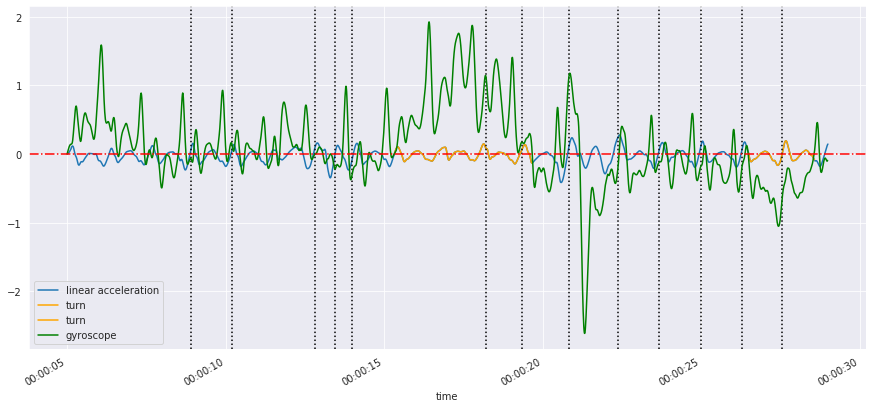

1fa674e9-2c49-4260-83f0-681ace2a5125
5f90116e-200a-44a2-bbfe-7d40c70c87ff
iPhone 8+; iOS/13.2
23.991025083
Sampling rate is 100.0 Hz
mean: -0.017092913753848978
std: 0.010368144798984482
Sampling rate is 100.0 Hz


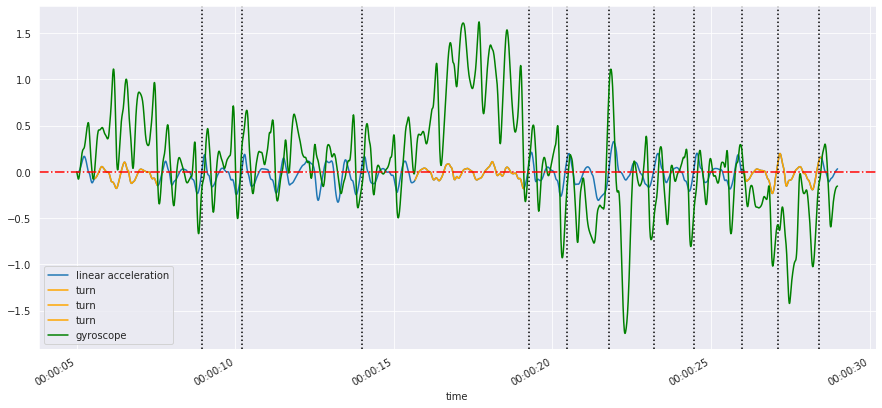

1fa674e9-2c49-4260-83f0-681ace2a5125
1d8a2d42-c1a7-4f45-b3aa-6ec566cf5144
iPhone 8+; iOS/13.2
23.990344625
Sampling rate is 100.0 Hz
mean: -0.013774034666967661
std: 0.013143320110602503
Sampling rate is 100.0 Hz


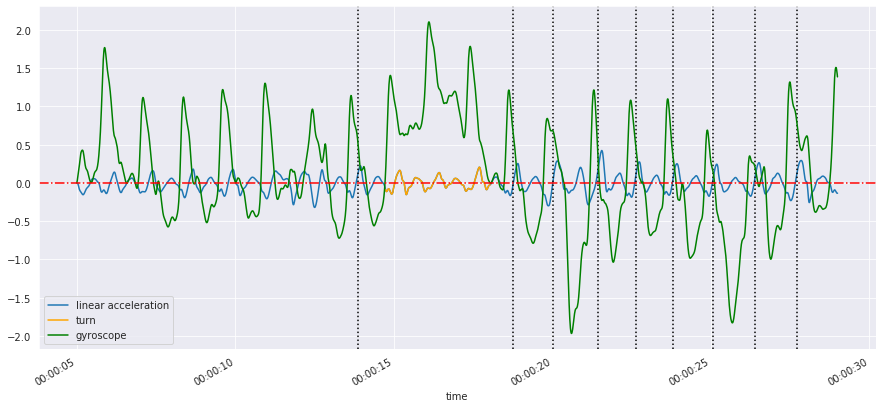

1fa674e9-2c49-4260-83f0-681ace2a5125
e1dfa0b7-1e9d-4cba-9f82-88fc97886c5f
iPhone 8+; iOS/13.2
23.982026124999997
Sampling rate is 100.0 Hz
mean: -0.01454072798678222
std: 0.008273004564357546
Sampling rate is 100.0 Hz


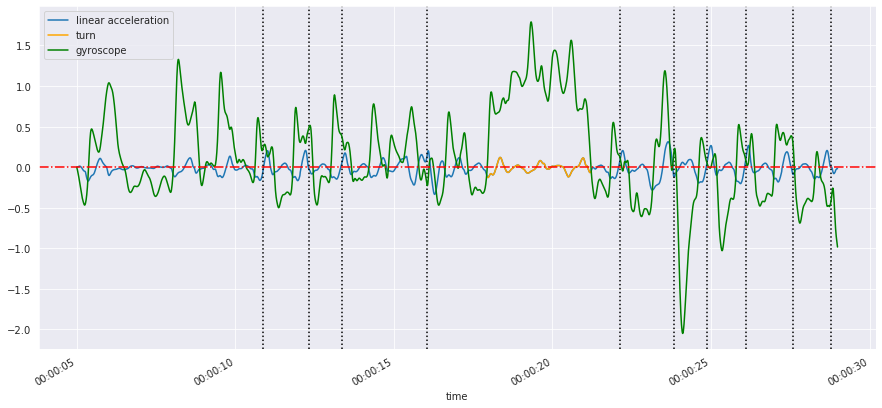

1fa674e9-2c49-4260-83f0-681ace2a5125
ab07c211-ee4c-4b53-8769-d7bd3f73fc95
iPhone 8+; iOS/13.2
23.98121275
Sampling rate is 100.0 Hz
mean: -0.01131531125879041
std: 0.00888181517912822
Sampling rate is 100.0 Hz


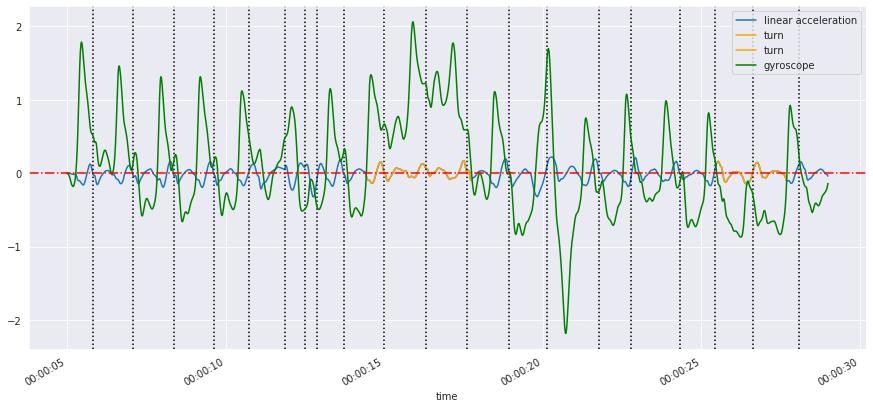

1fa674e9-2c49-4260-83f0-681ace2a5125
93512d23-baeb-48c7-a88b-40715621dcd5
iPhone 8+; iOS/13.2
23.989756625000002
Sampling rate is 100.0 Hz
mean: -0.026856776164691256
std: 0.015357892568022207
Sampling rate is 100.0 Hz


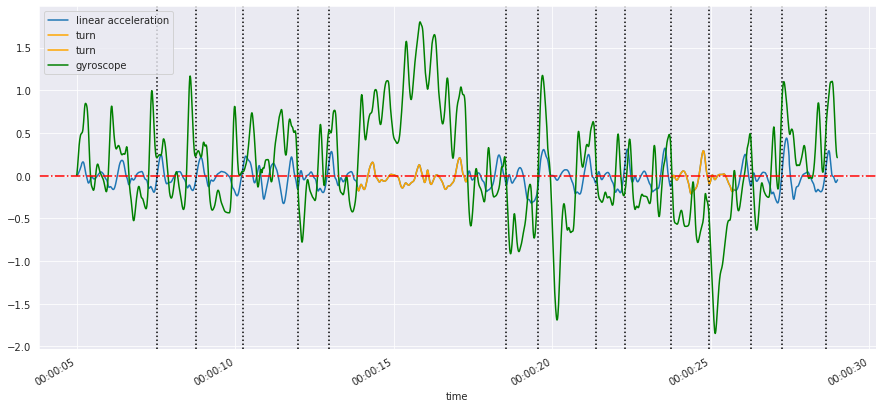

1fa674e9-2c49-4260-83f0-681ace2a5125
29bb94fd-ded3-44f0-b56b-62ad52fa92ac
iPhone 8+; iOS/13.2
23.989734708
Sampling rate is 100.0 Hz
mean: -0.013389421607734129
std: 0.004809372022488232
Sampling rate is 100.0 Hz


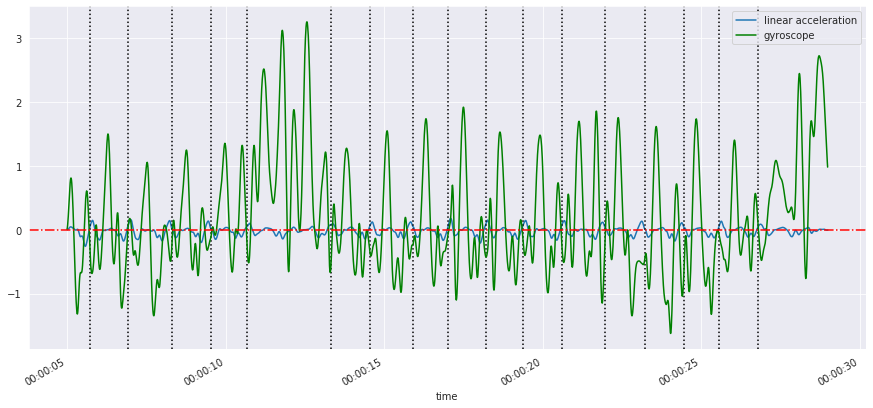

1fa674e9-2c49-4260-83f0-681ace2a5125
5de89051-aeb3-4c83-8c75-0b9fd3d89d0f
iPhone 8+; iOS/13.2
23.9833445
Sampling rate is 100.0 Hz
mean: -0.034252183719662904
std: 0.014272981015089514
Sampling rate is 100.0 Hz


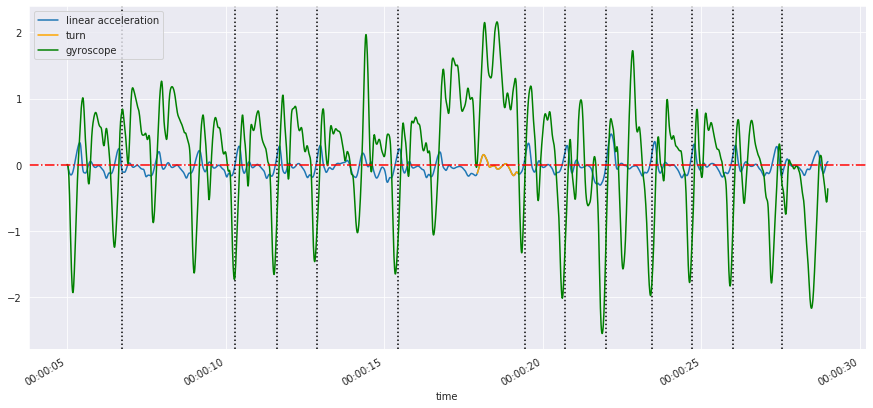

1fa674e9-2c49-4260-83f0-681ace2a5125
8ccd9c0e-c1c5-4eed-9834-772045abdf21
iPhone 8+; iOS/13.2
23.990175750000002
Sampling rate is 100.0 Hz
mean: -0.03155390219906195
std: 0.01901703811303498
Sampling rate is 100.0 Hz


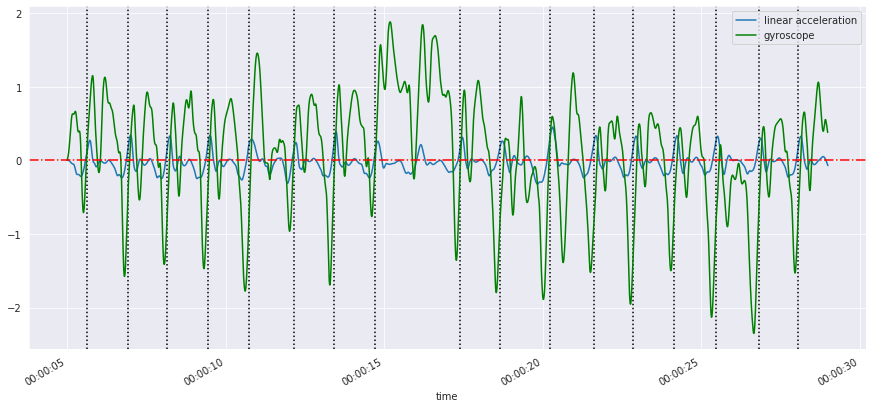

1fa674e9-2c49-4260-83f0-681ace2a5125
561621b6-ab91-44ab-a457-377d37542a37
iPhone 8+; iOS/13.2.3
23.992154208000002
Sampling rate is 100.0 Hz
mean: 0.02573311677315513
std: 0.0034416649500719734
Sampling rate is 100.0 Hz


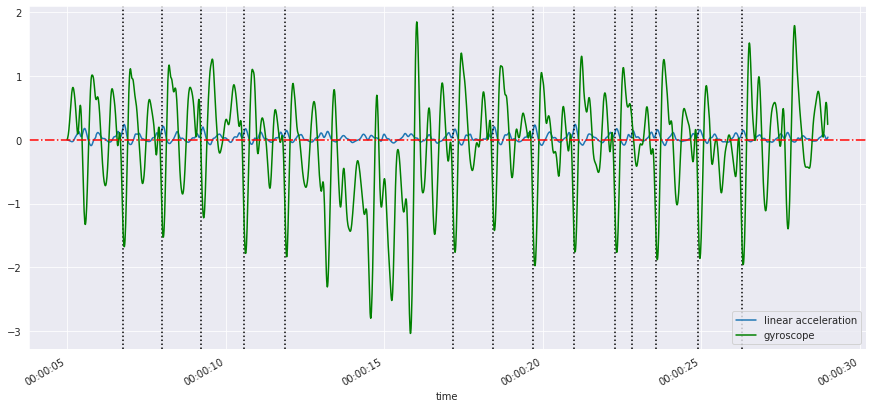

1fa674e9-2c49-4260-83f0-681ace2a5125
1d91daeb-32b8-439d-bd5b-c9758598fe0f
iPhone 8+; iOS/13.2.3
23.988726041
Sampling rate is 100.0 Hz
mean: -0.023243928207862054
std: 0.010541273718109591
Sampling rate is 100.0 Hz


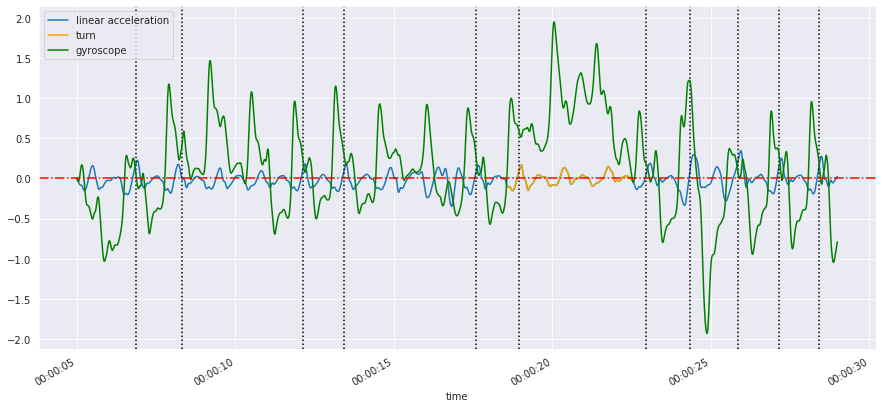

1fa674e9-2c49-4260-83f0-681ace2a5125
fa47f117-0ac6-496b-bdfc-46ac0fadcdf6
iPhone 8+; iOS/13.2.3
23.988668833
Sampling rate is 100.0 Hz
mean: -0.027347857037994847
std: 0.005481066668740734
Sampling rate is 100.0 Hz


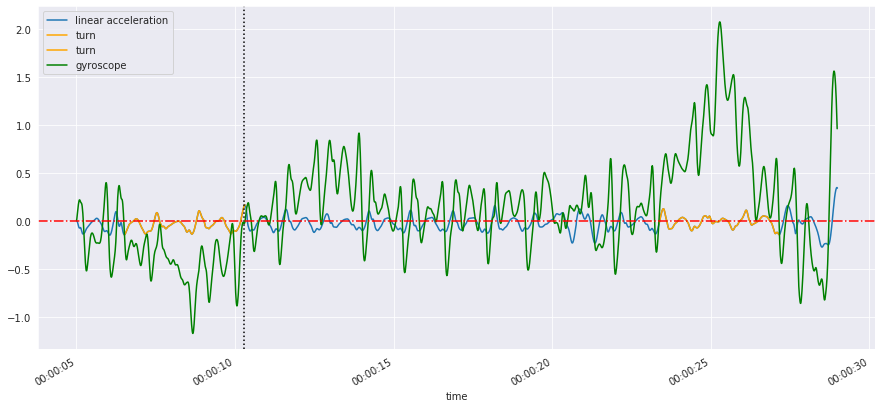

1fa674e9-2c49-4260-83f0-681ace2a5125
981491fa-14ca-4996-9f94-410f3dff8cd8
iPhone 8+; iOS/13.2.3
23.980872625
Sampling rate is 100.0 Hz
mean: -0.011738205141018624
std: 0.011358711362454482
Sampling rate is 100.0 Hz


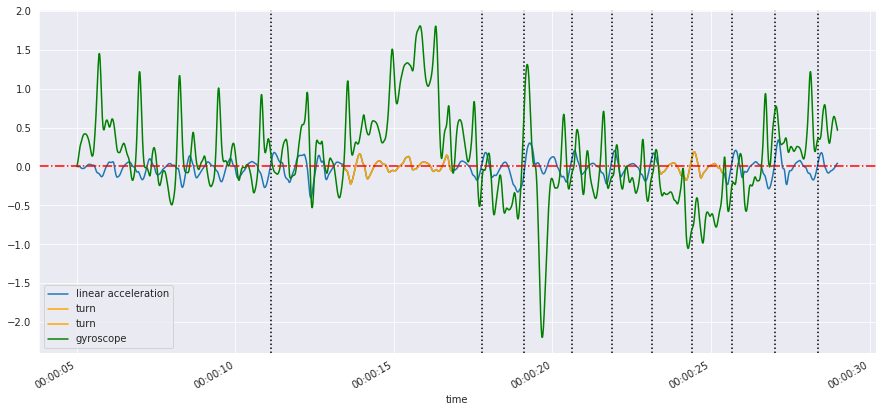

1fa674e9-2c49-4260-83f0-681ace2a5125
381f0909-2d99-49e9-99fd-d9490bb4da62
iPhone 8+; iOS/13.2.3
23.981230042
Sampling rate is 100.0 Hz
mean: 0.004311765764219096
std: 0.008467600849345138
Sampling rate is 100.0 Hz


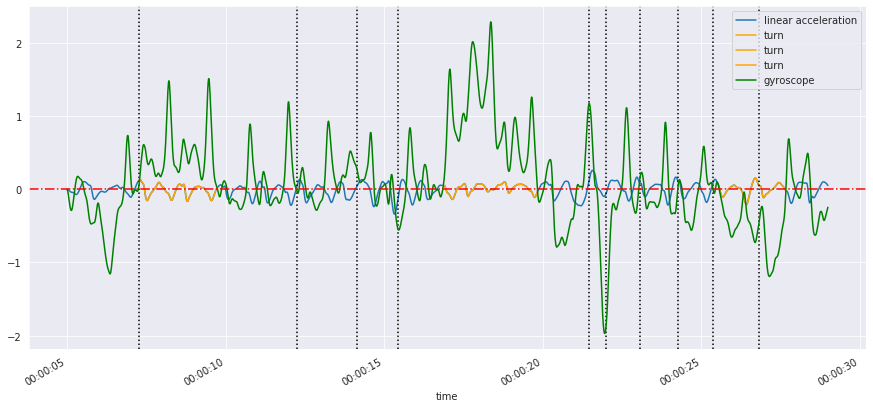

1fa674e9-2c49-4260-83f0-681ace2a5125
48b00cff-fd97-41a1-b1b9-e958be0975f1
iPhone 8+; iOS/13.2.3
23.981629374999997
Sampling rate is 100.0 Hz
mean: -0.01960319744969978
std: 0.0080374871275413
Sampling rate is 100.0 Hz


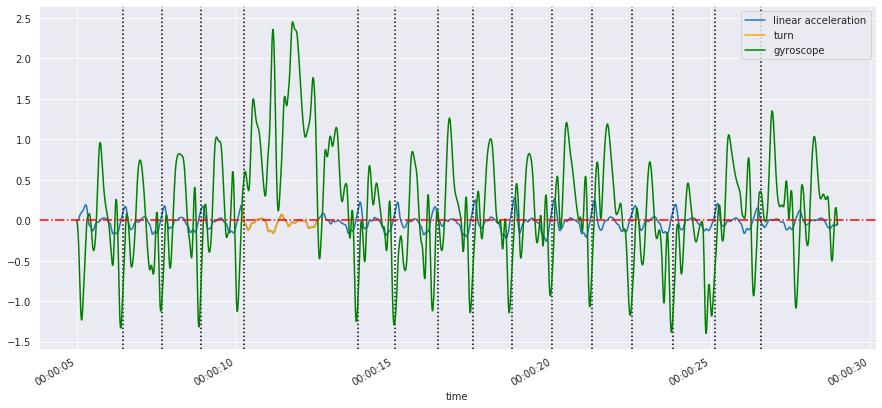

1fa674e9-2c49-4260-83f0-681ace2a5125
b33de258-30e1-4126-a315-6d23dda01314
iPhone 8+; iOS/13.2.3
23.982402709000002
Sampling rate is 100.0 Hz
mean: -0.0004907951182222919
std: 0.009993083138400414
Sampling rate is 100.0 Hz


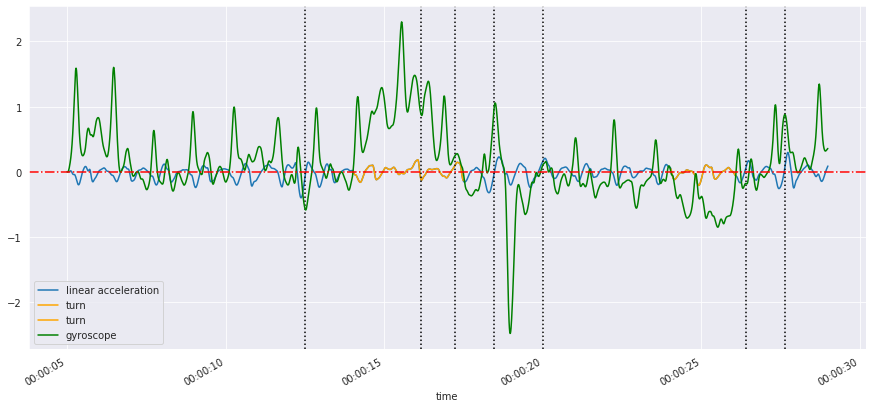

1fa674e9-2c49-4260-83f0-681ace2a5125
9545b748-9011-440f-9495-f71fec140888
iPhone 8+; iOS/13.2.3
23.991160834
Sampling rate is 100.0 Hz
mean: -0.027117621644255244
std: 0.007205151509943617
Sampling rate is 100.0 Hz


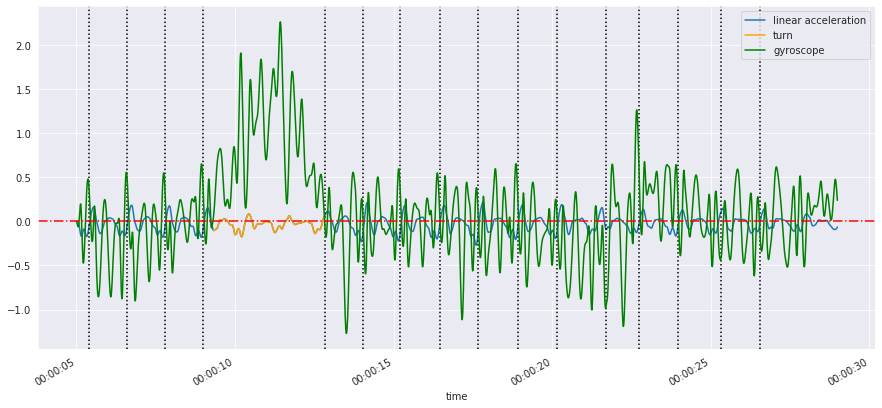

1fa674e9-2c49-4260-83f0-681ace2a5125
e504781f-cc2c-437c-bc2a-6aa42425209e
iPhone 8+; iOS/13.2.3
23.991860208
Sampling rate is 100.0 Hz
mean: -0.02909579842415895
std: 0.012216790801789725
Sampling rate is 100.0 Hz


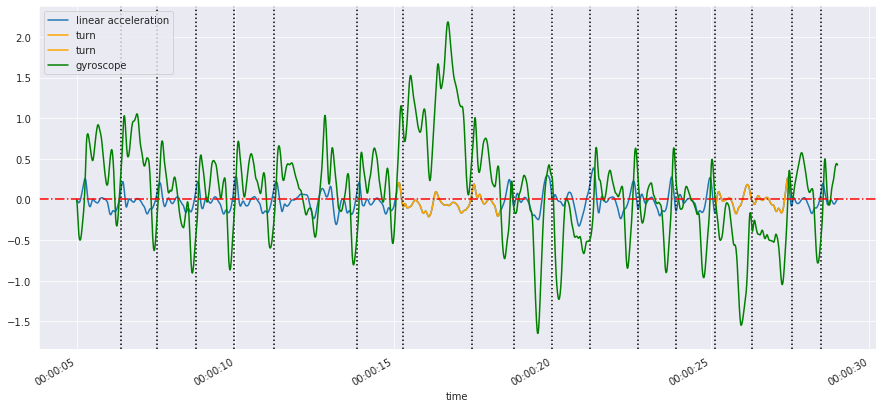

1fa674e9-2c49-4260-83f0-681ace2a5125
c059e30a-5054-4c6f-90ee-1a3004ceba91
iPhone 8+; iOS/13.2.3
23.981306125
Sampling rate is 100.0 Hz
mean: 0.005557696839838488
std: 0.00872221883111061
Sampling rate is 100.0 Hz


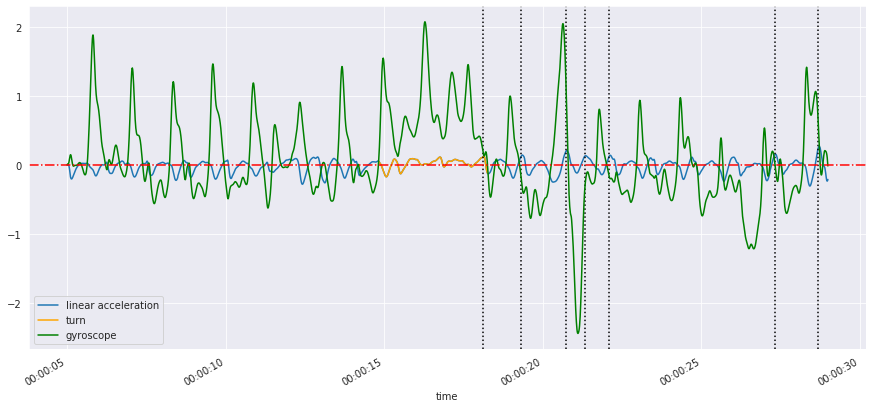

1fa674e9-2c49-4260-83f0-681ace2a5125
660e3467-0e7c-4f12-b58a-1d5b6f2d70ac
iPhone 8+; iOS/13.2.3
23.981937875
Sampling rate is 100.0 Hz
mean: -0.01789211970418019
std: 0.00995764993682125
Sampling rate is 100.0 Hz


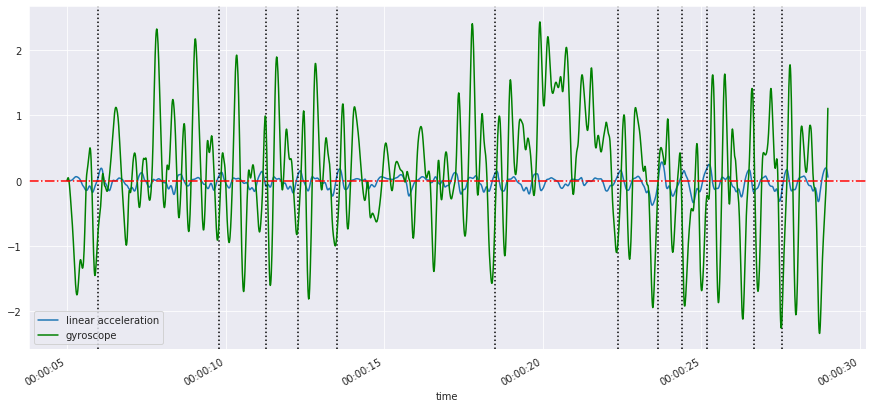

1fa674e9-2c49-4260-83f0-681ace2a5125
9fa389ff-6b31-4462-be39-a0da23594e8e
iPhone 8+; iOS/13.2.3
23.980803625
Sampling rate is 100.0 Hz
mean: -0.026727796687320487
std: 0.008081921640792054
Sampling rate is 100.0 Hz


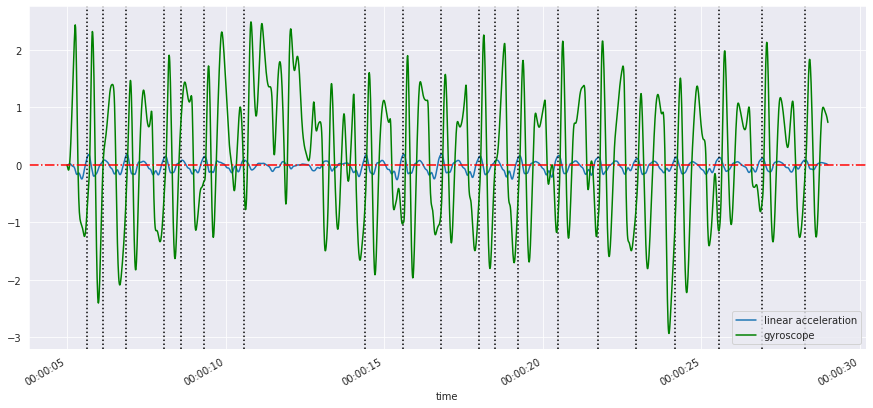

1fa674e9-2c49-4260-83f0-681ace2a5125
e4252beb-1d14-45d2-9859-13e97baab41d
iPhone 8+; iOS/13.2.3
23.984082
Sampling rate is 99.95833333333333 Hz
mean: -0.024461673221084827
std: 0.004281186741627087
Sampling rate is 99.95833333333333 Hz


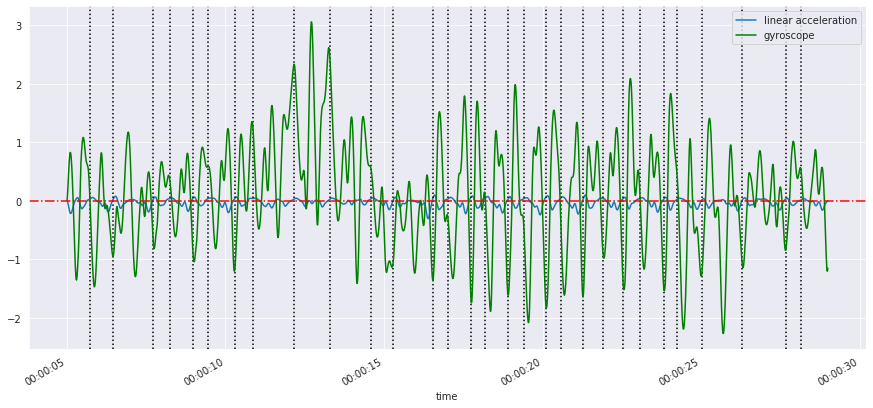

1fa674e9-2c49-4260-83f0-681ace2a5125
f073b092-7b5c-42e4-b574-e8972beecc9a
iPhone 8+; iOS/13.3
23.992437959
Sampling rate is 100.0 Hz
mean: 0.0010547809508898477
std: 0.005475775271745202
Sampling rate is 100.0 Hz


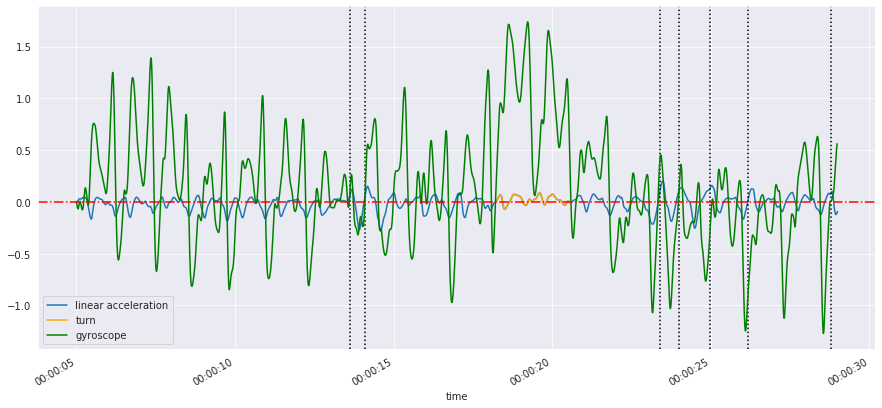

1fa674e9-2c49-4260-83f0-681ace2a5125
25d40a8d-11a4-4e6f-bb60-afe0c79687b9
iPhone 8+; iOS/13.3
23.982114666999998
Sampling rate is 100.0 Hz
mean: -0.016816584203129196
std: 0.008571772800734458
Sampling rate is 100.0 Hz


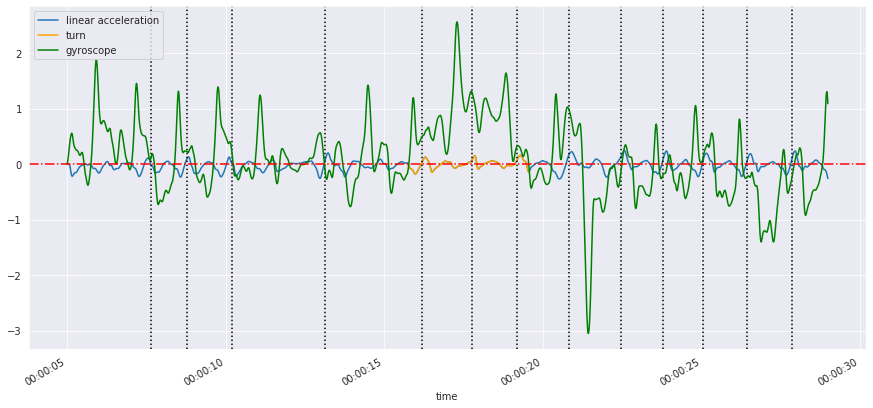

1fa674e9-2c49-4260-83f0-681ace2a5125
cf6519b2-f2bc-4f40-91ea-5f9ad4c79bab
iPhone 8+; iOS/13.3
23.981734250000002
Sampling rate is 100.0 Hz
mean: -0.028576949396962828
std: 0.01334078618500739
Sampling rate is 100.0 Hz


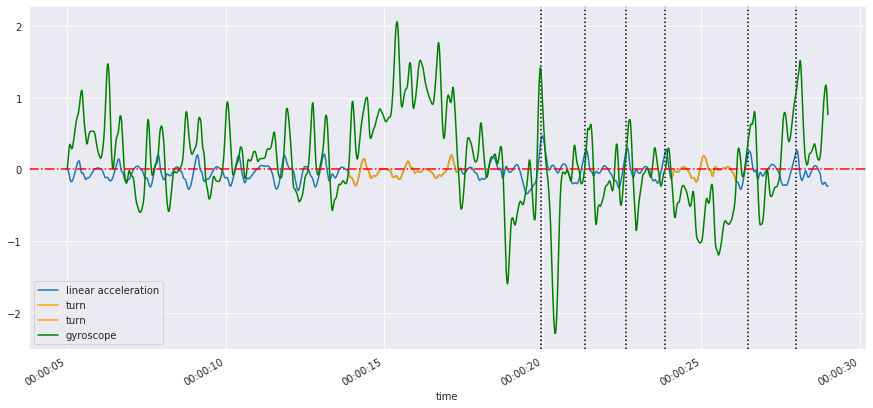

1fa674e9-2c49-4260-83f0-681ace2a5125
774cd60a-6769-4004-9d71-ab08d84bb958
iPhone 8+; iOS/13.3
23.991145832999997
Sampling rate is 100.0 Hz
mean: -0.02104997251164592
std: 0.006705849705176838
Sampling rate is 100.0 Hz


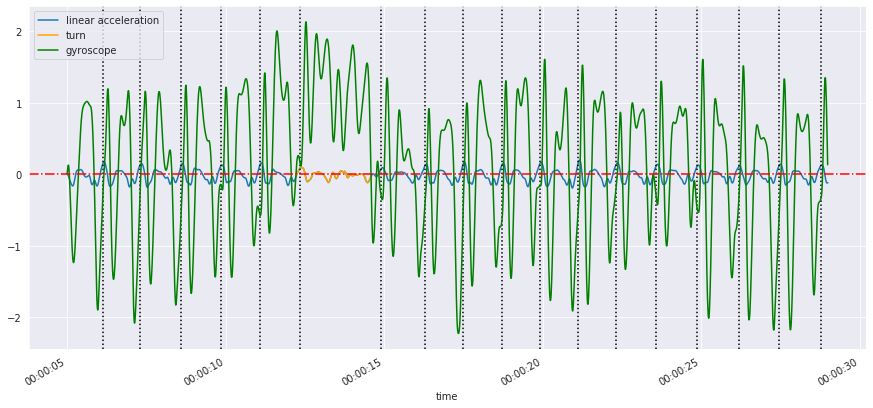

1fa674e9-2c49-4260-83f0-681ace2a5125
f4f32723-bef5-4eb1-a6cf-07eabb8d7775
iPhone 8+; iOS/13.3
23.989606167
Sampling rate is 100.0 Hz
mean: -0.027924163056046586
std: 0.025219398160287194
Sampling rate is 100.0 Hz


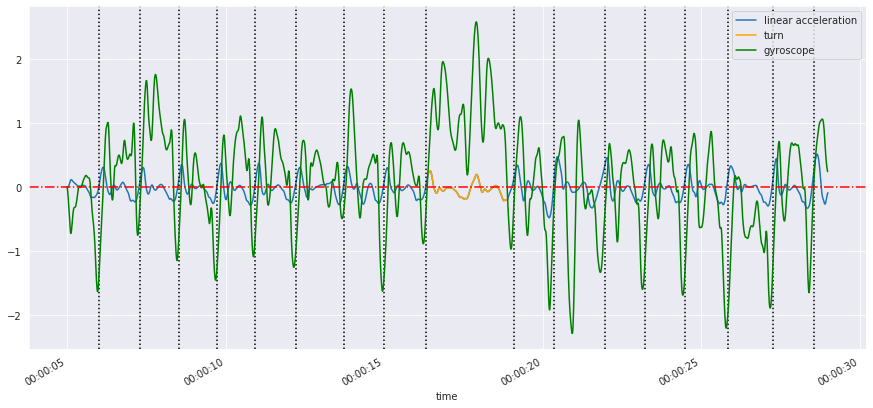

1fa674e9-2c49-4260-83f0-681ace2a5125
2f7994c6-9f99-43d6-93e9-dd248188877f
iPhone 8+; iOS/13.3
23.99039675
Sampling rate is 100.0 Hz
mean: -0.012191001858902734
std: 0.004508734979134355
Sampling rate is 100.0 Hz


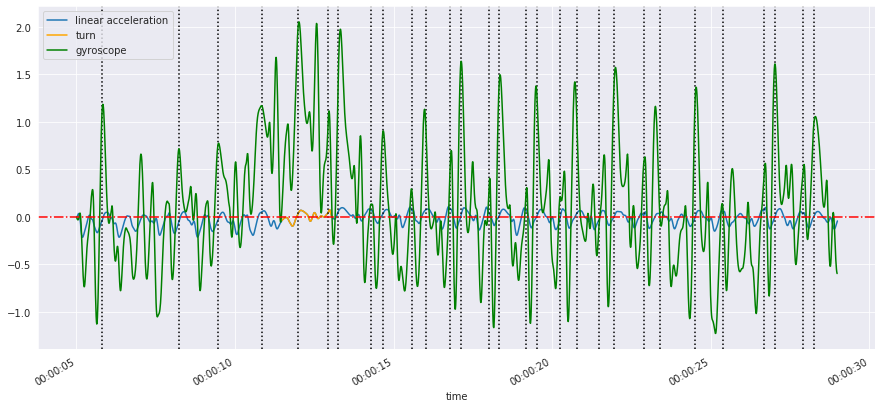

1fa674e9-2c49-4260-83f0-681ace2a5125
95e0064a-e9a5-4ebd-9894-27ef36eca106
iPhone 8+; iOS/13.3
23.991452125
Sampling rate is 100.0 Hz
mean: -0.03418019720475133
std: 0.020748541045569623
Sampling rate is 100.0 Hz


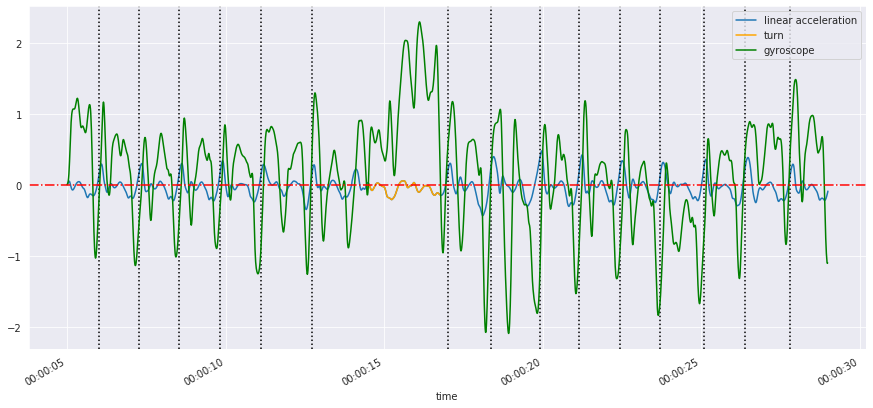

1fa674e9-2c49-4260-83f0-681ace2a5125
d1801c6e-34eb-4020-9d52-b885411fef25
iPhone 8+; iOS/13.3
23.989804125
Sampling rate is 100.0 Hz
mean: -0.017135377460263793
std: 0.004134453371978332
Sampling rate is 100.0 Hz


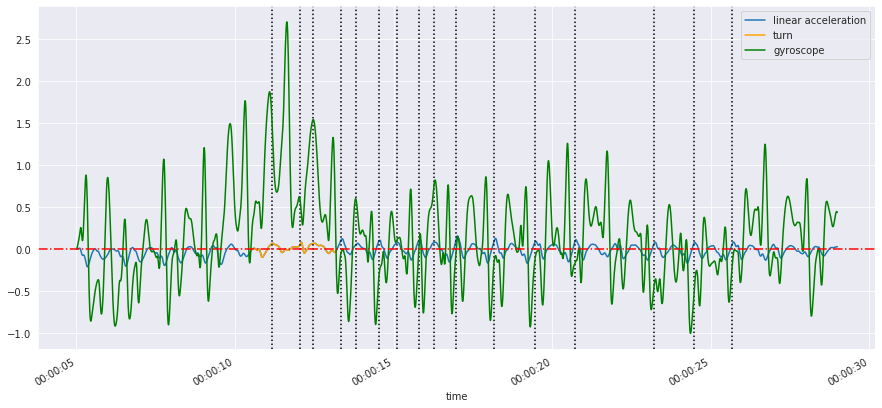

1fa674e9-2c49-4260-83f0-681ace2a5125
6515cf65-56f8-4a67-b26a-80ac5c6c2a4f
iPhone 8+; iOS/13.3
23.982534792
Sampling rate is 100.0 Hz
mean: -0.015298407013080538
std: 0.007453930089367804
Sampling rate is 100.0 Hz


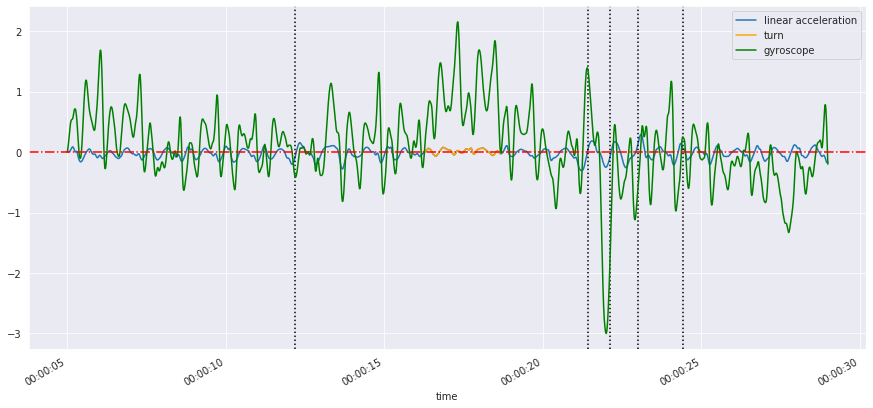

1fa674e9-2c49-4260-83f0-681ace2a5125
38cb9f2f-fb1b-4320-81c9-5c5c1a7524aa
iPhone 8+; iOS/13.3
23.982259292
Sampling rate is 100.0 Hz
mean: -0.035076588194269204
std: 0.025555111652259876
Sampling rate is 100.0 Hz


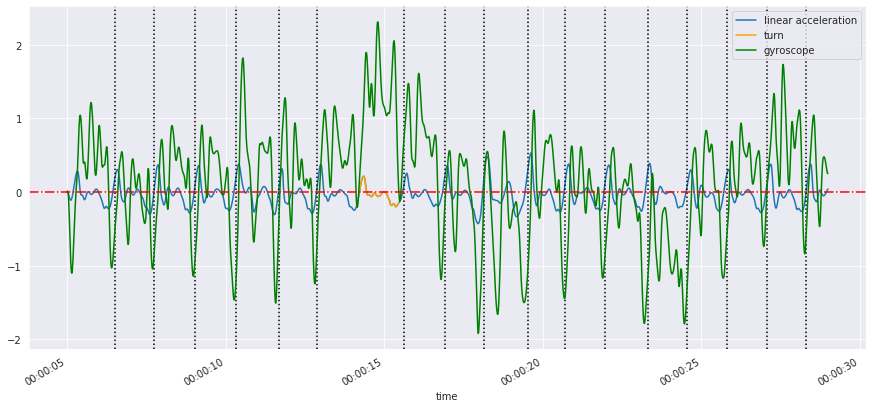

c52432c0-754b-4490-b131-9684da102f6c
040d1455-16a8-480d-98a5-0f6c584c6467
iPhone 6; iOS/12.4.1
23.990142958
Sampling rate is 100.0 Hz
mean: 0.13533042742384588
std: 0.030594817012713545
Sampling rate is 100.0 Hz


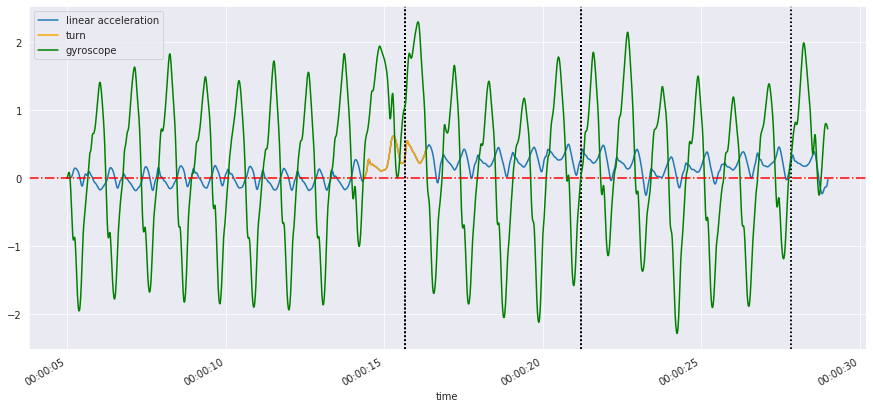

c52432c0-754b-4490-b131-9684da102f6c
0c3360ba-9be8-4362-b395-9d32a56015d1
iPhone 6; iOS/12.4.1
23.998939625
Sampling rate is 100.0 Hz
mean: 0.015665895531751725
std: 0.007029342314998755
Sampling rate is 100.0 Hz


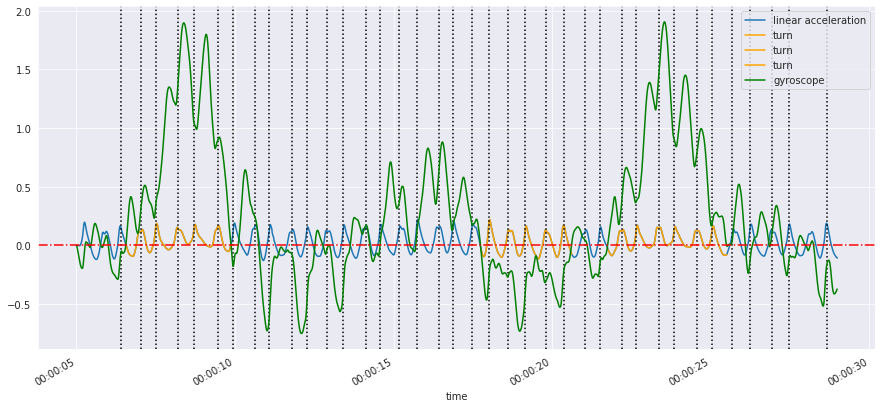

c52432c0-754b-4490-b131-9684da102f6c
91667e61-5515-4a33-bfc9-b8471a30c3d3
iPhone 6; iOS/12.4.1
23.98972
Sampling rate is 100.0 Hz
mean: 0.15816121306787748
std: 0.01333578148056578
Sampling rate is 100.0 Hz


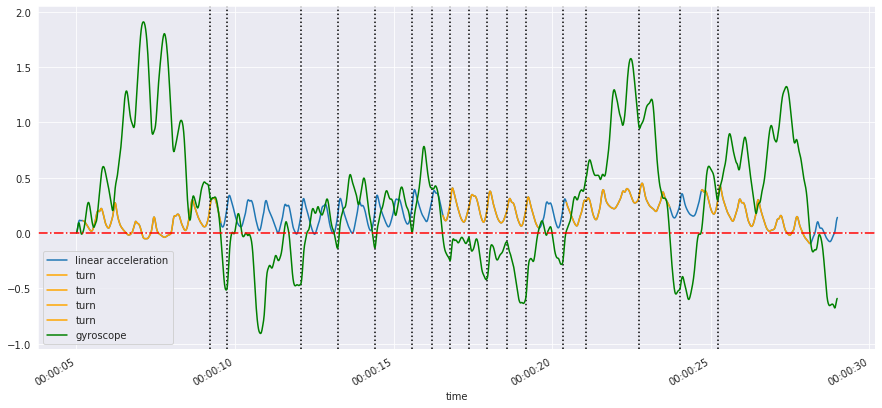

c52432c0-754b-4490-b131-9684da102f6c
9fb96110-e185-4cc7-b3e3-ec0678a99c99
iPhone 6; iOS/12.4.1
23.987469083
Sampling rate is 100.0 Hz
mean: 0.005913255089247613
std: 0.008659520444040348
Sampling rate is 100.0 Hz


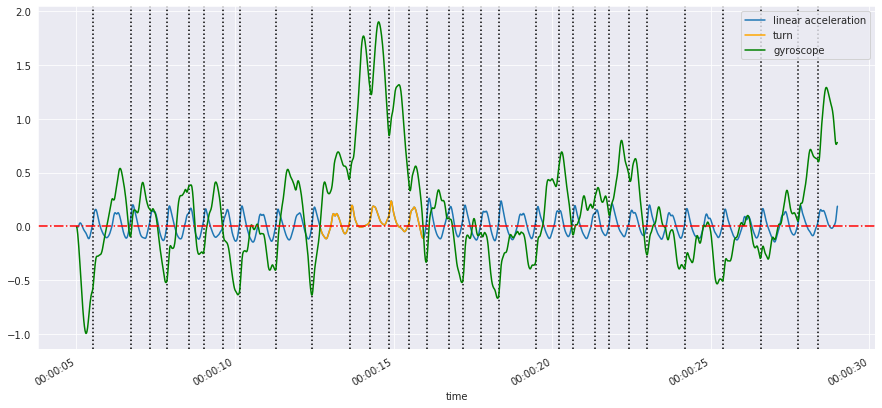

c52432c0-754b-4490-b131-9684da102f6c
1ea44950-c0d8-4164-b119-ec2e87a5fec3
iPhone 6; iOS/12.4.1
23.9897325
Sampling rate is 100.0 Hz
mean: 0.008115937873826584
std: 0.01019517432084421
Sampling rate is 100.0 Hz


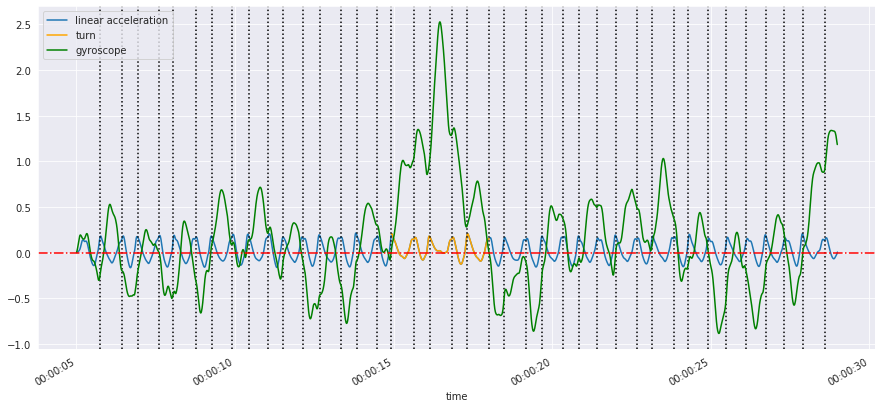

c52432c0-754b-4490-b131-9684da102f6c
ff02bdb6-5425-4507-befe-e0e68d4ac47e
iPhone 6; iOS/12.4.1
23.994084792
Sampling rate is 100.0 Hz
mean: 0.034643030616447704
std: 0.008067121243761789
Sampling rate is 100.0 Hz


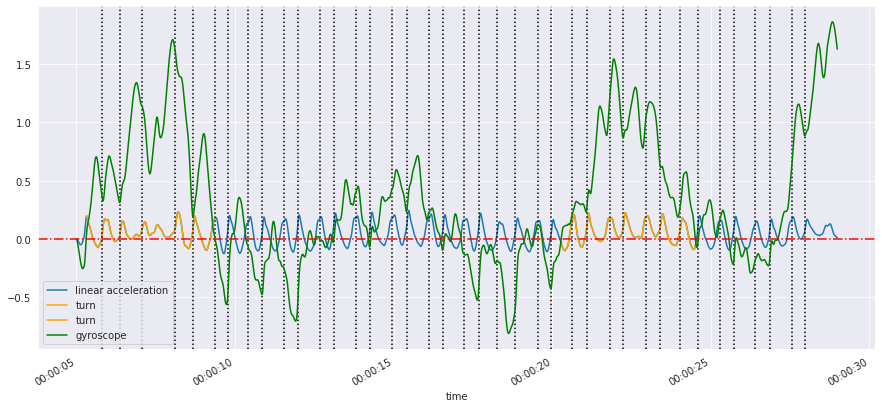

c52432c0-754b-4490-b131-9684da102f6c
aca45bd9-ccad-4930-a960-9b9e2b48b633
iPhone 6; iOS/12.4.1
23.987481664999997
Sampling rate is 100.0 Hz
mean: 0.0019588338402362045
std: 0.008401243268720646
Sampling rate is 100.0 Hz


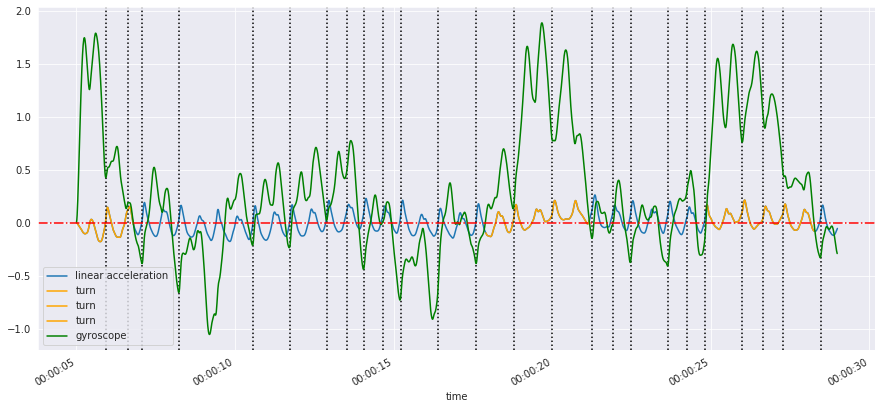

c52432c0-754b-4490-b131-9684da102f6c
a5629d8e-2ac4-41cd-b5b7-b1f64d1ce460
iPhone 6; iOS/12.4.1
23.985819541
Sampling rate is 100.0 Hz
mean: -0.003992130534141686
std: 0.011500425598467885
Sampling rate is 100.0 Hz


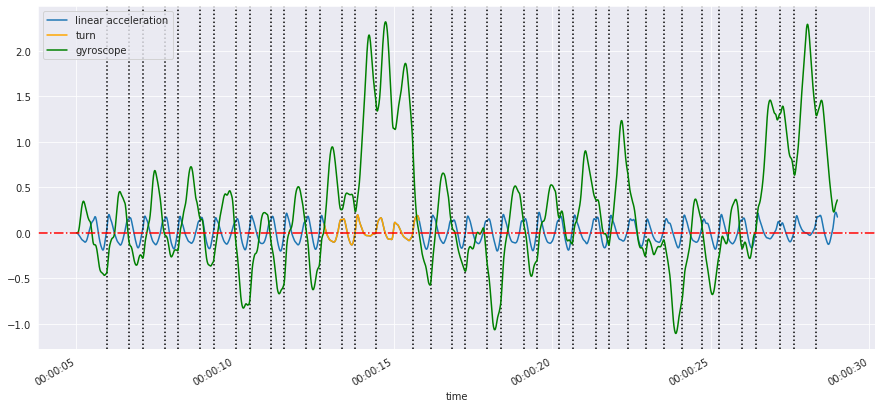

e8167893-1b3a-4c71-94f4-5b3cb9b52165
08242686-9865-4cc3-9db3-c5f16b8aadce
iPhone 7+; iOS/12.3.1
23.998431
Sampling rate is 100.0 Hz
mean: 0.016489019263634632
std: 0.00427194415602352
Sampling rate is 100.0 Hz


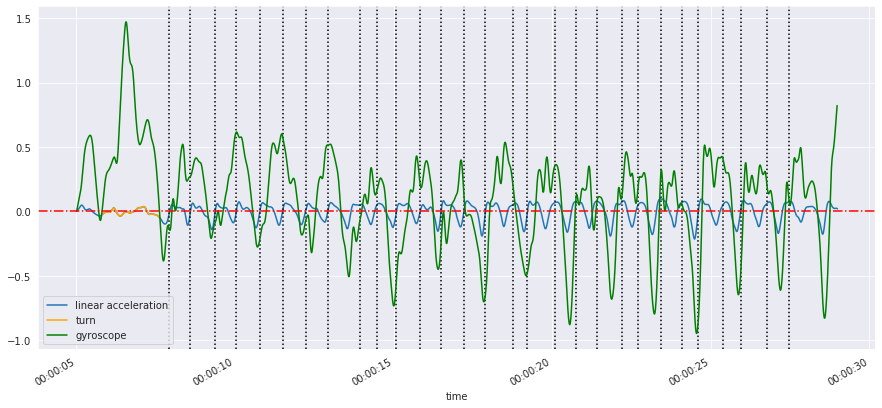

e8167893-1b3a-4c71-94f4-5b3cb9b52165
afd16d07-98f3-40f1-b60e-7790bcc6990b
iPhone 7+; iOS/12.3.1
23.991313292
Sampling rate is 100.0 Hz
mean: -0.0032945211536544224
std: 0.008520346285113398
Sampling rate is 100.0 Hz


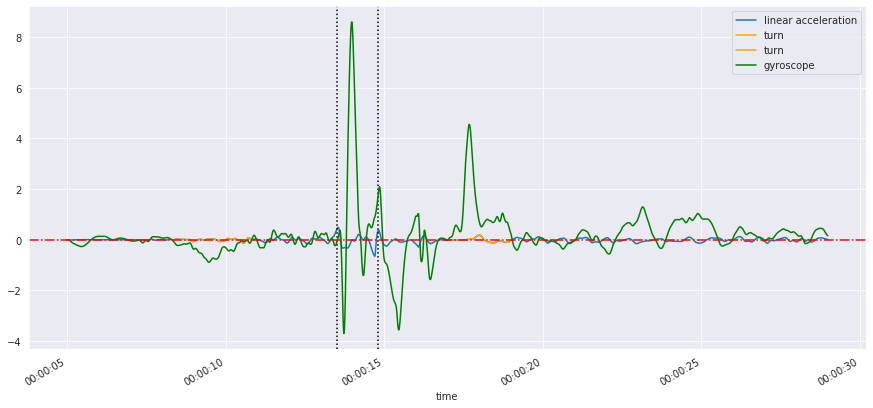

e8167893-1b3a-4c71-94f4-5b3cb9b52165
9b655c09-73dd-45fc-926d-5a22b68395d6
iPhone 7+; iOS/12.3.1
23.988703125
Sampling rate is 100.0 Hz
mean: 0.000838098355272045
std: 0.00360531371380221
Sampling rate is 100.0 Hz


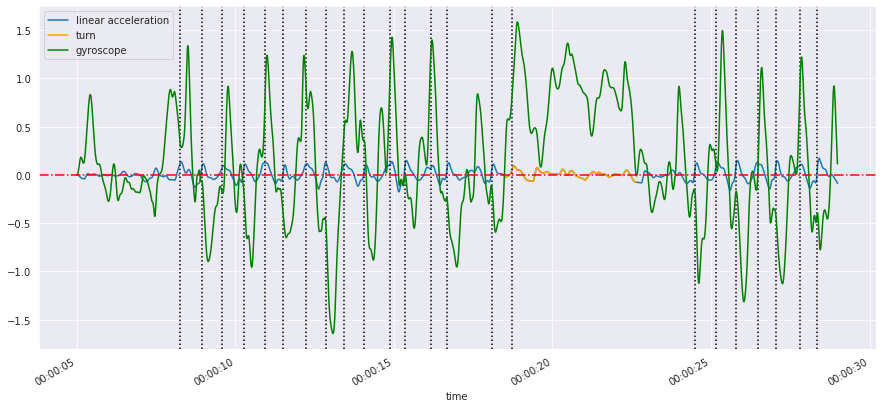

f80e44ed-ce6f-4aff-8a6a-cfa74c823f6a
dc86d49d-885e-411a-b9e7-9a148f8e09d7
iPhone SE; iOS/13.1.3
23.998476834
Sampling rate is 100.0 Hz
mean: 0.019471476108474696
std: 0.004168920441506
Sampling rate is 100.0 Hz


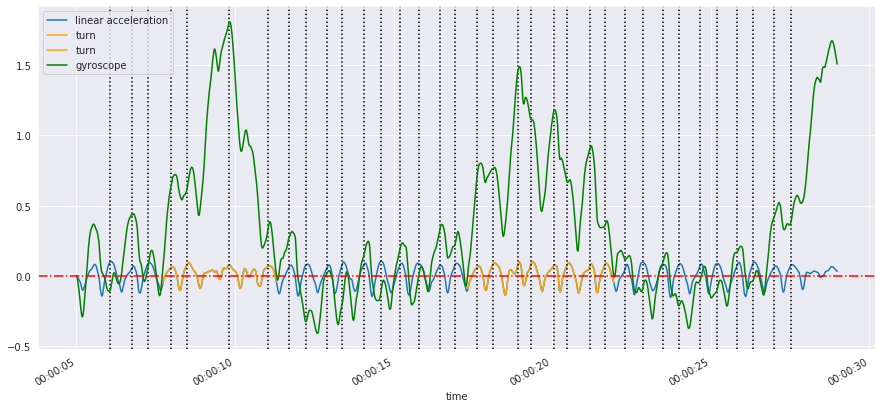

f80e44ed-ce6f-4aff-8a6a-cfa74c823f6a
c8118189-7e10-4aed-b8c7-0ee12c43d724
iPhone SE; iOS/13.3
23.989086709
Sampling rate is 100.0 Hz
mean: 0.018864870237425398
std: 0.004074227308793479
Sampling rate is 100.0 Hz


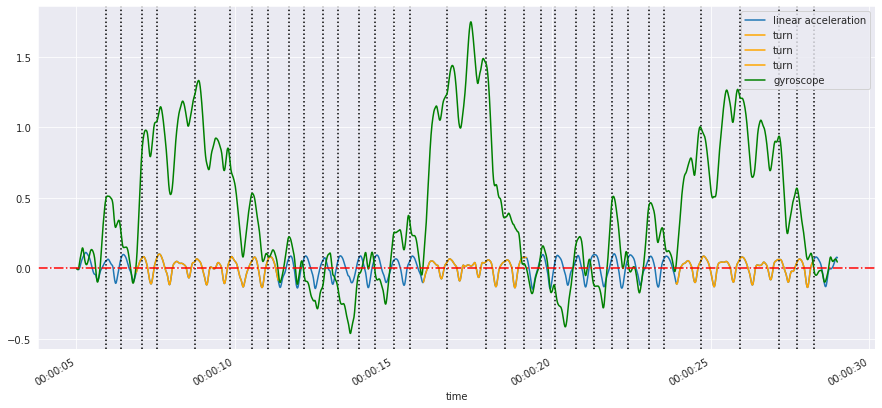

f80e44ed-ce6f-4aff-8a6a-cfa74c823f6a
38889cb7-6b01-466d-9e32-8e7727f08cb1
iPhone SE; iOS/13.3
23.989517
Sampling rate is 100.0 Hz
mean: -0.00603429093073077
std: 0.0030358874233630336
Sampling rate is 100.0 Hz


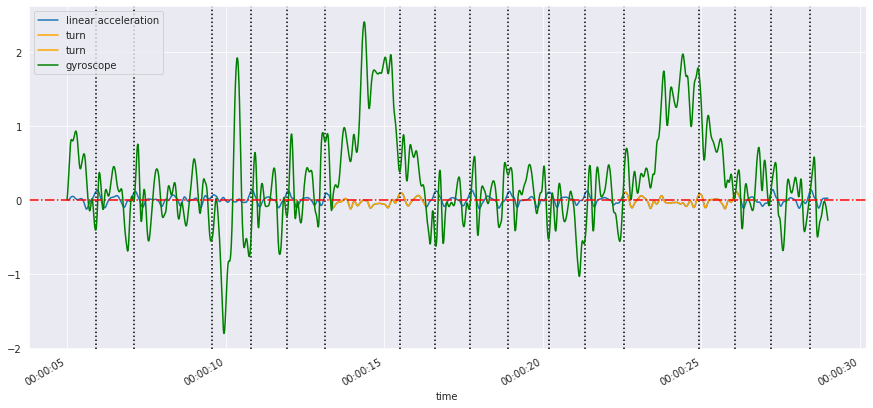

f80e44ed-ce6f-4aff-8a6a-cfa74c823f6a
65573fa0-4584-432b-a07e-75c69e7bc926
iPhone SE; iOS/13.3
23.99007575
Sampling rate is 100.0 Hz
mean: 0.021322819884507755
std: 0.004630147751164077
Sampling rate is 100.0 Hz


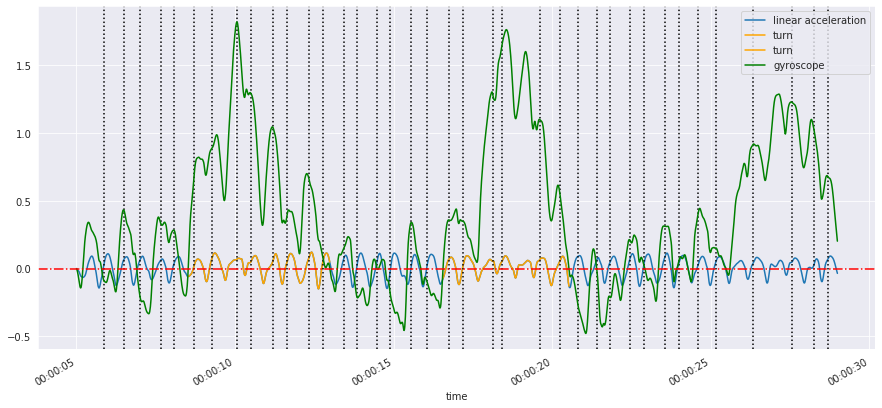

f80e44ed-ce6f-4aff-8a6a-cfa74c823f6a
eadbe94f-7ce9-42be-ad06-90fd3d83834c
iPhone SE; iOS/13.3
23.986456959
Sampling rate is 100.0 Hz
mean: 0.014076473164760447
std: 0.004408043716946755
Sampling rate is 100.0 Hz


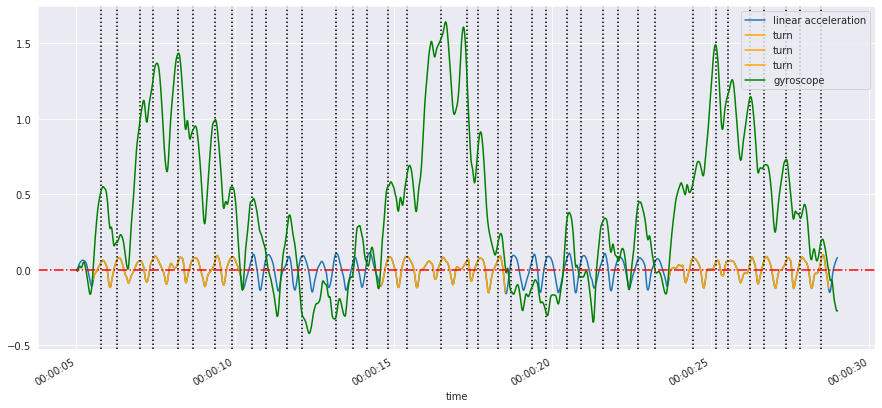

f80e44ed-ce6f-4aff-8a6a-cfa74c823f6a
0d66c4cb-f53b-46ba-a235-5236913c2a69
iPhone SE; iOS/13.3
23.985673916
Sampling rate is 100.0 Hz
mean: -0.005696290327957232
std: 0.0031841341254947855
Sampling rate is 100.0 Hz


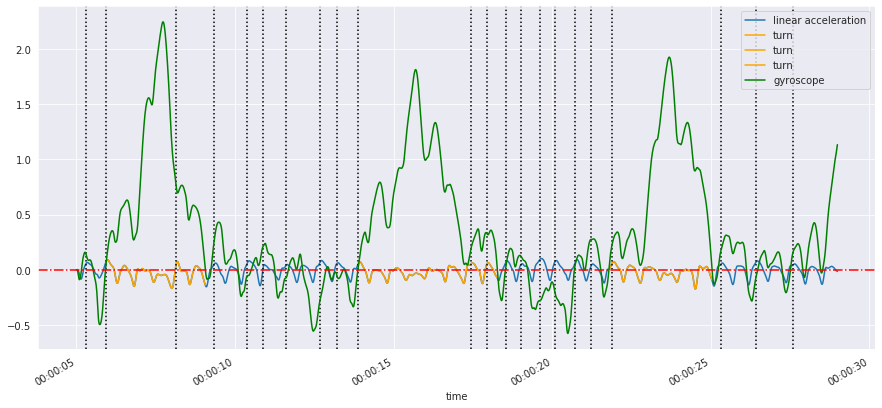

In [17]:
def plot_overlay_data(data, gyro_data, orient, strikes = True):
    plt.figure(figsize = (15,7))
    data[orient].plot(label = "linear acceleration")
    unq_period = data[data["aucXt"] > 2]["period"].unique()
    gp = pdkit.GaitProcessor(duration = data.td[-1] - data.td[0])
    for period in unq_period:
        data[data["period"] == period][orient].plot(color = "orange", legend = False, label = "turn")
    if strikes:
        try:
            heel_strikes_idx = gp.heel_strikes(data[orient.split("_")[1]])[1]
        except:
            heel_strikes_idx = []
        for index in heel_strikes_idx:
            if len(heel_strikes_idx)>0:
                plt.axvline(x=data.iloc[index].name, color='black', linestyle=':')
    gyro_data[orient].plot(color = "green", label = "gyroscope")
    plt.axhline(y=0.0, color='r', linestyle='-.')
    plt.legend()
    plt.grid()
    plt.show()
    
def create_overlay_data(accel_data, rotation_data):
    test = pd.merge(accel_data, rotation_data, on = "td", how = "left")
    test["time"] = test["td"]
    test = test.set_index("time")
    test.index = pd.to_datetime(test.index, unit = "s")
    test["aucXt"] = test["aucXt"].fillna(method = "bfill")
    test["period"] = test["period"].fillna(method = "bfill")
    return test

for path, healthcode, recordId, phoneInfo in zip(path_data["walk_motion.json_pathfile"], path_data["healthCode"], path_data["recordId"], path_data["phoneInfo"]):
    if path != "#ERROR":
        print(healthcode)
        print(recordId)
        print(phoneInfo)
        _ts = query.open_filepath(path)
        _ts = query.clean_accelerometer_data(_ts)
        gyroscope = _ts[_ts["sensorType"] == "rotationRate"]
        acceleration = _ts[_ts["sensorType"] == "accelerometer"]
        user_acceleration = _ts[_ts["sensorType"] == "userAcceleration"]
        
        if (user_acceleration.shape[0] != 0) or (gyroscope.shape[0] != 0):
            accel_data = get_accel_longitudinal(user_acceleration, 5, 28)
            gyro_data = get_gyro_longitudinal(gyroscope, 5, 28)
            rotation_data = calculate_rotation(gyro_data, "filtered_y")
            overlaid_data = create_overlay_data(accel_data, rotation_data)
            plot_overlay_data(overlaid_data, gyro_data, "filtered_y")

It seems that without subsetting the data, PDKIT are somewhat able to not mistakenly detect rotational movement as a heel strike, however, there are still some walking sample that detects rotational movement as a heel strike occurences, which is not what we want on our feature pipeline. The next step would be to remove part of the dataset that contains rotaional movement. 

Note moving rotational movement might cause differences in samples of data taken, therefore we will assess by using feature that is independent of time, such as <b> "cleaned_rotation_number_of_steps_per_second" </b>.

# Stationarity and Cheking Mean of Longitudinal Data

## 4. Removing rotational movement from PDKIT computation


TODO:
- compare before after
- run pdkit on chunk

In [344]:
_ts = query.open_filepath(path_data["walk_motion.json_pathfile"].iloc[50])
_ts = query.clean_accelerometer_data(_ts)
gyroscope = _ts[_ts["sensorType"] == "rotationRate"]
acceleration = _ts[_ts["sensorType"] == "accelerometer"]
user_acceleration = _ts[_ts["sensorType"] == "userAcceleration"]
accel_data = get_accel_longitudinal(user_acceleration, 5, 25)
gyro_data = get_gyro_longitudinal(gyroscope, 5, 25)
rotation_data = calculate_rotation(gyro_data, "filtered_y")
overlaid_data = create_overlay_data(accel_data, rotation_data)

20.992669542
Sampling rate is 100.0 Hz
Sampling rate is 100.0 Hz


In [345]:
unq_period = overlaid_data[overlaid_data["aucXt"] > 2]["period"].unique()

In [346]:
dict_df = {}
time_start = overlaid_data.index[0]
for i, chunk in zip(unq_period, range(1, len(unq_period) + 1)):
    time_end = overlaid_data[overlaid_data["period"] == i].index[0]
    dict_df["chunk %s" %chunk] = overlaid_data.loc[time_start: time_end] 
    time_start = overlaid_data[overlaid_data["period"] == i].index[-1]

In [347]:
dict_df["chunk 2"]

,eventAccuracy,timestamp,uptime,w,x,y,z,td,AA,filtered_x,filtered_y,filtered_z,auc,period,aucXt
time,,,,,,,,,,,,,,,
1970-01-01 00:00:09.633773000,NaN,9.642895,167780.930260,NaN,0.401239,-0.289851,0.098682,9.633773,0.504722,-0.089651,-0.143724,-0.097003,1.241222,2.283339,2.834132
1970-01-01 00:00:09.643832000,NaN,9.652954,167780.940319,NaN,0.482294,-0.333828,0.101177,9.643832,0.595219,-0.070675,-0.159887,-0.092885,NaN,0.020117,0.000003
1970-01-01 00:00:09.653891000,NaN,9.663013,167780.950378,NaN,0.538656,-0.420272,0.053348,9.653891,0.685292,-0.046866,-0.176092,-0.086808,0.000144,0.020117,0.000003
1970-01-01 00:00:09.663949000,NaN,9.673071,167780.960436,NaN,0.546112,-0.464790,0.013045,9.663949,0.717243,-0.018629,-0.193044,-0.079663,NaN,1.146699,0.583315
1970-01-01 00:00:09.674008000,NaN,9.683130,167780.970495,NaN,0.479753,-0.514326,-0.019594,9.674008,0.703618,0.012924,-0.211191,-0.072310,NaN,1.146699,0.583315
1970-01-01 00:00:09.684067000,NaN,9.693189,167780.980554,NaN,0.358189,-0.581683,-0.086033,9.684067,0.688518,0.045903,-0.230839,-0.065514,NaN,1.146699,0.583315
1970-01-01 00:00:09.694126000,NaN,9.703248,167780.990613,NaN,0.218068,-0.511882,-0.147243,9.694126,0.575549,0.077969,-0.251874,-0.060102,NaN,1.146699,0.583315
1970-01-01 00:00:09.704184000,NaN,9.713306,167781.000671,NaN,0.113836,-0.420263,-0.093637,9.704184,0.445362,0.106974,-0.273172,-0.056418,NaN,1.146699,0.583315
1970-01-01 00:00:09.714243000,NaN,9.723365,167781.010730,NaN,0.058880,-0.354002,-0.009508,9.714243,0.358991,0.131534,-0.293224,-0.053762,NaN,1.146699,0.583315


In [218]:
first_chunk = overlaid_data.iloc[0:arr[0][0]]

In [228]:
second_chunk = overlaid_data.iloc[arr[0][-1]:]

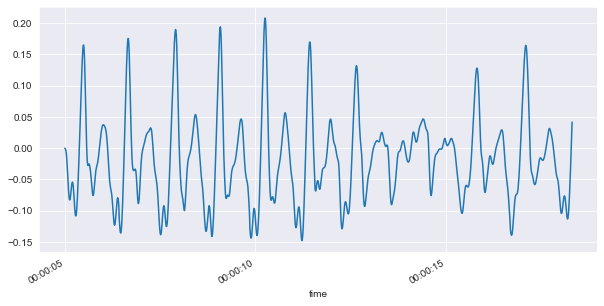

In [256]:
first_chunk["filtered_y"].plot()
plt.grid()

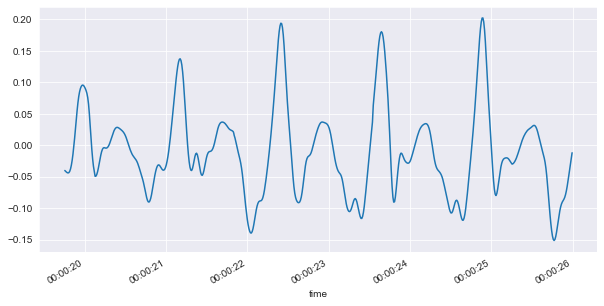

In [257]:
second_chunk["filtered_y"].plot()
plt.grid()